# Importing required libraries

In [1]:
import pandas as pd
import numpy as np
import datetime

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.feature_selection import RFE

# Initialization

In [2]:
%load_ext autoreload
%autoreload 2

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
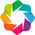

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
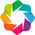

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
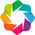

Wall time: 8.24 s


In [3]:
%%time

# Third-party imports
import os.path as op
import pandas as pd
import great_expectations as ge

# Project imports
from ta_lib.core.api import display_as_tabs, initialize_environment

# Initialization
initialize_environment(debug=False, hide_warnings=True)

# Data

In [4]:
from ta_lib.core.api import create_context, list_datasets, load_dataset

In [5]:
config_path = op.join('conf', 'config.yml')
context = create_context(config_path)

In [6]:
list_datasets(context)

['/raw/google',
 '/raw/product_manufacturer_list',
 '/raw/sales_data',
 '/raw/social_media_data',
 '/raw/Theme_list',
 '/raw/Theme_product_list',
 '/cleaned/orders',
 '/cleaned/product',
 '/cleaned/sales',
 '/processed/sales',
 '/train/sales/features',
 '/train/sales/target',
 '/test/sales/features',
 '/test/sales/target',
 '/score/sales/output']

# Reading datasets

In [7]:
# load datasets
sales_data = load_dataset(context, 'raw/sales_data')
social_media_data = load_dataset(context, 'raw/social_media_data')
google_search_data = load_dataset(context, 'raw/google')
product_manufacturer_list = load_dataset(context, 'raw/product_manufacturer_list')
theme_product_list = load_dataset(context, 'raw/Theme_product_list')
theme_list = load_dataset(context, 'raw/Theme_list')

In [8]:
# Import the eda API
import ta_lib.eda.api as eda

In [9]:
display_as_tabs([('sales_data', sales_data.shape), ('social_media_data', social_media_data.shape), 
                 ('google', google_search_data.shape), ('product_manufacturer_list', product_manufacturer_list.shape), 
                 ('theme_product_list', theme_product_list.shape), ('theme_list', theme_list.shape)])


Tabs
    [0] Str(tuple, name='sales_data')
    [1] Str(tuple, name='social_media_data')
    [2] Str(tuple, name='google')
    [3] Str(tuple, name='product_manufacturer_list...)
    [4] Str(tuple, name='theme_product_list')
    [5] Str(tuple, name='theme_list')

In [10]:
display_as_tabs([('sales_data', sales_data.head()), ('social_media_data', social_media_data.head()), 
                 ('google', google_search_data.head()), ('product_manufacturer_list', product_manufacturer_list.head()), 
                 ('theme_product_list', theme_product_list.head()), ('theme_list', theme_list.head())])


Tabs
    [0] DataFrame(name='sales_data', value=   system_calendar_key_N  ...)
    [1] DataFrame(name='social_media_data', value=   Theme Id published_date...)
    [2] DataFrame(name='google', value=         date p...)
    [3] DataFrame(name='product_manufacturer_list..., value=   PRODUCT_ID  ...)
    [4] DataFrame(name='theme_product_list', value=   PRODUCT_ID  ...)
    [5] DataFrame(name='theme_list', value=   CLAIM_ID Claim N...)

In [11]:
social_media_data.isna().sum()

Theme Id          218511
published_date         0
total_post             0
dtype: int64

In [12]:
#social_media_data.fillna(method='ffill', inplace=True)

In [13]:
#product_manufacturer_list.drop(columns=['Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6'], inplace=True)

In [14]:
product_manufacturer_list.head()

,PRODUCT_ID,Vendor
0,1,Others
1,2,Others
2,3,Others
3,4,Others
4,5,Others


## Total themes available in the dataset

In [15]:
total_themes = theme_list['Claim Name'].unique()

In [16]:
print("Total themes available are {}".format(len(total_themes)))

Total themes available are 208


# Data Preparation from social media, google search and sales data.

## Renaming required data sources columns

### sales_data

In [17]:
social_media_data.dropna(inplace=True)

In [18]:
sales_data.rename(columns={'product_id': 'PRODUCT_ID'}, inplace=True)

### social_media_data

In [19]:
social_media_data.dropna(inplace=True)

In [20]:
social_media_data['Theme Id'] = social_media_data['Theme Id'].apply(lambda x: int(x))

In [21]:
social_media_data.rename(columns={'Theme Id': 'CLAIM_ID'}, inplace=True)

### google_search_data

In [22]:
google_search_data.dropna(inplace=True)

In [23]:
google_search_data.rename(columns={'Claim_ID': 'CLAIM_ID'}, inplace=True)

### google_search_data

In [24]:
google_search_data.dropna(inplace=True)

In [25]:
google_search_data.rename(columns={'Claim_ID': 'CLAIM_ID'}, inplace=True)

## Provide the list of themes available across all data sources

In [26]:
# Mapping products and themes into one dataframe - merging theme_product_list and theme_list

product_to_theme_mapping = pd.merge(theme_product_list, theme_list, on='CLAIM_ID')
product_to_theme_mapping

,PRODUCT_ID,CLAIM_ID,Claim Name
0,26,8,low carb
1,29,8,low carb
2,86,8,low carb
3,87,8,low carb
4,120,8,low carb
...,...,...,...
91480,46085,0,No Claim
91481,34907,0,No Claim
91482,18274,211,halal
91483,28113,211,halal


## Themes available in sales_data

In [27]:
# List of themes available in sales_data datasource


In [28]:
# Merging product to theme mapping - merging sales_data and theme_product_list

sales_data_product_to_theme_mapping = pd.merge(sales_data, product_to_theme_mapping, on='PRODUCT_ID')
sales_data_product_to_theme_mapping

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name
0,20160109,1,13927.0,934,18680,0,No Claim
1,20160123,1,12628.0,878,17564,0,No Claim
2,20160206,1,11379.0,810,16200,0,No Claim
3,20160130,1,11568.0,821,16424,0,No Claim
4,20160213,1,10959.0,784,15682,0,No Claim
...,...,...,...,...,...,...,...
7767415,20191005,56817,699.0,37,129,0,No Claim
7767416,20191005,56818,486.0,7,158,0,No Claim
7767417,20191005,56924,53.0,3,16,8,low carb
7767418,20191005,57045,6.0,1,7,0,No Claim


In [29]:
# List of themes available in sales_data datasource

themes_in_sales_data = sales_data_product_to_theme_mapping['Claim Name'].unique()
themes_in_sales_data

array(['No Claim', 'chicken', 'salmon', 'apple cinnamon', 'pollock',
       'cookie', 'pizza', 'soy foods', 'blueberry',
       'american southwest style', 'herbs', 'poultry', 'ethnic & exotic',
       'stroganoff', 'no additives/preservatives', 'buckwheat',
       'low carb', 'gmo free', 'low sodium', 'french bisque',
       'ethical - packaging', 'american gumbo', 'crab',
       'energy/alertness', 'beef hamburger', 'low sugar',
       'high/source of protein', 'brown ale', 'gingerbread', 'beans',
       'vegetarian', 'prebiotic', 'tilapia', 'peanut', 'nuts', 'cocoa',
       'red raspberry', 'mackerel', 'scallop', 'low calorie',
       'convenience - easy-to-prepare', 'peach', 'cherry', 'sea salt',
       'bone health', 'cumin', 'tuna', 'halal', 'ethical - not specific'],
      dtype=object)

In [30]:
print("List of unique themes available in sales_data are {}".format(len(themes_in_sales_data)))

List of unique themes available in sales_data are 49


## Themes available in social_media_data

In [31]:
# List of Themes available in social_media_data datasource


In [32]:
social_media_data.head()

,CLAIM_ID,published_date,total_post
0,148,10-01-2015,76
1,148,10-10-2015,31
2,148,10-11-2015,65
3,148,10-12-2015,88
4,148,10/13/2015,85


In [33]:
# Merging claims_in_social_media_data and theme_list for themes in social_media_data datasource

social_media_data_theme_mapping = pd.merge(social_media_data, theme_list, on='CLAIM_ID')
social_media_data_theme_mapping

,CLAIM_ID,published_date,total_post,Claim Name
0,148,10-01-2015,76,tuna
1,148,10-10-2015,31,tuna
2,148,10-11-2015,65,tuna
3,148,10-12-2015,88,tuna
4,148,10/13/2015,85,tuna
...,...,...,...,...
314874,876,09-05-2019,4658,caramel
314875,876,09-06-2019,3731,caramel
314876,876,09-07-2019,2336,caramel
314877,876,09-08-2019,1374,caramel


In [34]:
# List of themes available in social_media_data datasource

themes_in_social_media_data = social_media_data_theme_mapping['Claim Name'].unique()
themes_in_social_media_data

array(['tuna', 'allergy', 'convenience - packaging', 'oral health',
       'mint', 'dry', 'traditional', 'antioxidant', 'peppermint',
       'skin health', 'banana', 'crab', 'mango', 'peanut butter',
       'immune health', 'broccoli', 'spinach',
       'convenience - ready prepared', 'toffee', 'indulgent & premium',
       'organic', 'low fat', 'vitamin/mineral fortified', 'trout',
       'low calorie', 'bacon', 'coconut', 'red apple',
       'high/source of fiber', 'low sodium', 'no added sugar',
       'green bean', 'omega-3', 'bone health', 'green tea', 'cranberry',
       'heart health', 'weight management', 'celery', 'strawberry',
       'dandelion greens', 'prebiotic', 'ethical - packaging',
       'eye health', 'poultry', 'parsley', 'economy', 'cheddar cheese',
       'venison', 'ethical - animal/fish & bird', 'low sugar',
       'ricotta cheese', 'joint health', 'brain health',
       'roquefort cheese', 'no trans fats', 'sugar free', 'diabetic',
       'hfcs free', 'low chole

In [35]:
print("List of unique themes available in social_media_data are {}".format(len(themes_in_social_media_data)))

List of unique themes available in social_media_data are 193


## Themes available in google_search_data

In [36]:
# List of Themes available in google_search_data datasource


In [37]:
google_search_data.head()

,date,platform,searchVolume,CLAIM_ID,week_number,year_new
0,05-01-2014,google,349,916,1,2014
1,06-01-2014,google,349,916,2,2014
2,07-01-2014,google,697,916,2,2014
3,10-01-2014,google,349,916,2,2014
4,20-01-2014,google,697,916,4,2014


In [38]:
# Merging claims_in_google_search_data and theme_list for themes in google_search_data datasource

google_search_data_theme_mapping = pd.merge(google_search_data, theme_list, on='CLAIM_ID')
google_search_data_theme_mapping

,date,platform,searchVolume,CLAIM_ID,week_number,year_new,Claim Name
0,05-01-2014,google,349,916,1,2014,gluten free
1,06-01-2014,google,349,916,2,2014,gluten free
2,07-01-2014,google,697,916,2,2014,gluten free
3,10-01-2014,google,349,916,2,2014,gluten free
4,20-01-2014,google,697,916,4,2014,gluten free
...,...,...,...,...,...,...,...
181560,24-07-2019,google,42,843,30,2019,snickerdoodle
181561,25-09-2019,google,84,843,39,2019,snickerdoodle
181562,04-06-2018,amazon,135,606,23,2018,hemp seeds
181563,31-01-2019,amazon,39,433,5,2019,gingerbread


In [39]:
# List of themes available in google_search_data datasource

themes_in_google_search_data = google_search_data_theme_mapping['Claim Name'].unique()
themes_in_google_search_data

array(['gluten free', 'low carb', 'natural', 'digestive/gut health',
       'high/source of protein', 'no additives/preservatives', 'allergy',
       'convenience - packaging', 'oral health', 'dry', 'traditional',
       'antioxidant', 'skin health', 'immune health',
       'convenience - ready prepared', 'indulgent & premium', 'organic',
       'low fat', 'vitamin/mineral fortified', 'low calorie',
       'high/source of fiber', 'low sodium', 'no added sugar', 'omega-3',
       'bone health', 'heart health', 'weight management', 'prebiotic',
       'ethical - packaging', 'eye health', 'economy',
       'ethical - animal/fish & bird', 'low sugar', 'joint health', 'dha',
       'brain health', 'no trans fats', 'sugar free', 'diabetic',
       'hfcs free', 'low cholesterol', 'low gi', 'lactose free',
       'wholegrain', 'added calcium', 'added fiber', 'added protein',
       'added iron', 'anti-aging/aging-well', 'energy/alertness',
       'sports & recovery', 'functional, not specified

In [40]:
print("List of unique themes available in themes_in_google_search_data are {}".format(len(themes_in_google_search_data)))

List of unique themes available in themes_in_google_search_data are 160


## Common themes between all data sources

In [41]:
def common_themes(a, b):
    a_set = set(a)
    b_set = set(b)
 
    if (a_set & b_set):
        final_arr = list(a_set & b_set)
    
    return final_arr

In [42]:
common_themes_btw_sales_and_social = common_themes(themes_in_sales_data, themes_in_social_media_data)

In [43]:
len(common_themes_btw_sales_and_social)

38

In [44]:
common_themes_btw_sales_and_google = common_themes(themes_in_sales_data, themes_in_google_search_data)

In [45]:
len(common_themes_btw_sales_and_google)

30

In [46]:
common_themes_btw_social_and_google = common_themes(themes_in_social_media_data, themes_in_google_search_data)

In [47]:
len(common_themes_btw_social_and_google)

159

In [48]:
len(themes_in_sales_data)

49

In [49]:
len(themes_in_social_media_data)

193

In [50]:
len(themes_in_google_search_data)

160

In [51]:
##

<AxesSubplot:>

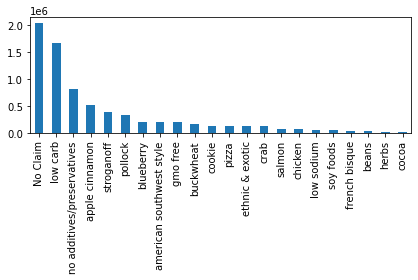

In [52]:
sales_data_product_to_theme_mapping["Claim Name"].value_counts()[:22].plot(kind="bar")

In [53]:
sales_data_product_to_theme_mapping.groupby("Claim Name")["sales_units_value"].sum().sort_values(ascending=False)

Claim Name
No Claim                         18581260352
low carb                          2627421936
no additives/preservatives        1559993572
stroganoff                        1391218733
apple cinnamon                     805116403
soy foods                          449104186
pollock                            378731037
gmo free                           327952459
buckwheat                          307259973
salmon                             288110889
pizza                              267479854
cookie                             267479854
ethnic & exotic                    135668268
blueberry                          125512861
american southwest style           125512861
french bisque                       82170776
chicken                             69625831
crab                                41664448
low sodium                          35262508
american gumbo                      20572186
brown ale                           19890723
low calorie                         18261984

## Provide a report for data sufficiency, sparsity, and anomalies in each data source

## sales_data dataset

In [54]:
sales_data.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value
0,20160109,1,13927.0,934,18680
1,20160109,3,10289.0,1592,28646
2,20160109,4,357.0,22,440
3,20160109,6,23113.0,2027,81088
4,20160109,7,23177.0,3231,58164


In [55]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4526182 entries, 0 to 4526181
Data columns (total 5 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   system_calendar_key_N  int64  
 1   PRODUCT_ID             int64  
 2   sales_dollars_value    float64
 3   sales_units_value      int64  
 4   sales_lbs_value        int64  
dtypes: float64(1), int64(4)
memory usage: 172.7 MB


In [56]:
sales_data.describe()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value
count,4.526182e+06,4.526182e+06,4.526182e+06,4.526182e+06,4.526182e+06
mean,2.017505e+07,2.885857e+04,2.159454e+04,5.160053e+03,1.715339e+04
std,1.073537e+04,1.531254e+04,7.818057e+04,2.685341e+04,1.273401e+05
min,2.016011e+07,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00
25%,2.016123e+07,1.506900e+04,5.230000e+02,8.000000e+01,8.600000e+01
50%,2.017121e+07,2.998100e+04,2.655000e+03,4.030000e+02,6.110000e+02
75%,2.018110e+07,4.151300e+04,1.176500e+04,1.807000e+03,3.770000e+03
max,2.019100e+07,5.731700e+04,4.395964e+06,8.739980e+05,1.100310e+07


## social_media_data dataset

In [57]:
social_media_data.head()

,CLAIM_ID,published_date,total_post
0,148,10-01-2015,76
1,148,10-10-2015,31
2,148,10-11-2015,65
3,148,10-12-2015,88
4,148,10/13/2015,85


In [58]:
social_media_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 314879 entries, 0 to 533389
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   CLAIM_ID        314879 non-null  int64 
 1   published_date  314879 non-null  object
 2   total_post      314879 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 9.6+ MB


In [59]:
social_media_data.describe()

,CLAIM_ID,total_post
count,314879.000000,314879.000000
mean,618.714049,129.535358
std,290.145829,631.087924
min,8.000000,0.000000
25%,440.000000,1.000000
50%,677.000000,9.000000
75%,870.000000,50.000000
max,999.000000,71280.000000


## google_search_data dataset

In [60]:
google_search_data.head()

,date,platform,searchVolume,CLAIM_ID,week_number,year_new
0,05-01-2014,google,349,916,1,2014
1,06-01-2014,google,349,916,2,2014
2,07-01-2014,google,697,916,2,2014
3,10-01-2014,google,349,916,2,2014
4,20-01-2014,google,697,916,4,2014


In [61]:
google_search_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 181565 entries, 0 to 181564
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   date          181565 non-null  object
 1   platform      181565 non-null  object
 2   searchVolume  181565 non-null  int64 
 3   CLAIM_ID      181565 non-null  int64 
 4   week_number   181565 non-null  int64 
 5   year_new      181565 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 9.7+ MB


In [62]:
google_search_data.describe()

,searchVolume,CLAIM_ID,week_number,year_new
count,181565.000000,181565.000000,181565.000000,181565.000000
mean,5823.349318,629.557629,25.169823,2017.013196
std,11251.075181,284.426899,14.613668,1.655898
min,1.000000,8.000000,1.000000,2014.000000
25%,281.000000,516.000000,13.000000,2016.000000
50%,1173.000000,670.000000,25.000000,2017.000000
75%,5539.000000,901.000000,37.000000,2018.000000
max,370484.000000,999.000000,53.000000,2019.000000


## Report on all data sources

In [63]:
def report(data_source, data_source_name):
    print("*************************** Report on {} ******************************************".format(data_source_name))
    print("Numerical description of the data\n", data_source.describe())
    print("***************************************************************************************")
    print("Total no of themes available in {} is {}".format(data_source_name, len(data_source["Claim Name"].unique())))
    print("***************************************************************************************")
    print("List of themes across all {} is {} \n".format(data_source_name, data_source["Claim Name"].unique()))
    print("***************************************************************************************")
    print("Missing values details\n", data_source.isnull().sum())
    plt.figure(figsize=(10, 7))
    data_source["Claim Name"].value_counts()[:22].plot(kind="bar")
    plt.title("Consumer Preference in " + data_source_name, fontsize=20)
    plt.show()

*************************** Report on Sales data source ******************************************
Numerical description of the data
        system_calendar_key_N    PRODUCT_ID  sales_dollars_value  \
count           7.767420e+06  7.767420e+06         7.767420e+06   
mean            2.017536e+07  2.719737e+04         1.956811e+04   
std             1.071372e+04  1.440538e+04         6.762102e+04   
min             2.016011e+07  1.000000e+00         0.000000e+00   
25%             2.017012e+07  1.446500e+04         6.780000e+02   
50%             2.017123e+07  2.721600e+04         3.097000e+03   
75%             2.018112e+07  3.905600e+04         1.253800e+04   
max             2.019100e+07  5.731700e+04         4.395964e+06   

       sales_units_value  sales_lbs_value      CLAIM_ID  
count       7.767420e+06     7.767420e+06  7.767420e+06  
mean        3.610720e+03     1.315570e+04  9.086082e+01  
std         2.080517e+04     9.969849e+04  1.321988e+02  
min         1.000000e+00     0

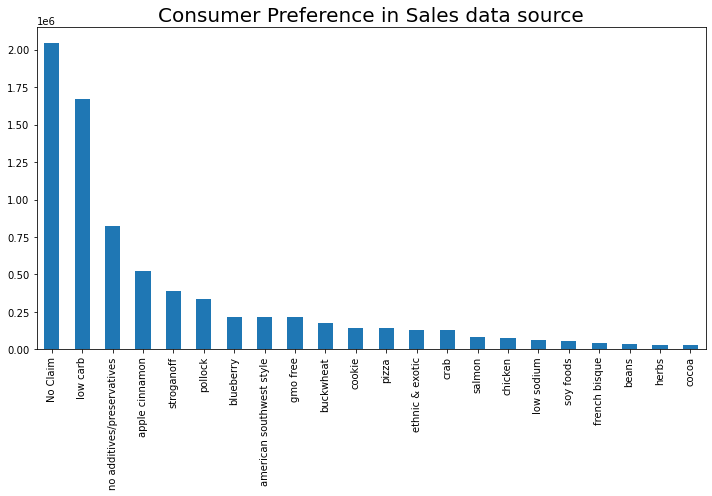

In [64]:
report(sales_data_product_to_theme_mapping, "Sales data source")

*************************** Report on Social media data source ******************************************
Numerical description of the data
             CLAIM_ID     total_post
count  314879.000000  314879.000000
mean      618.714049     129.535358
std       290.145829     631.087924
min         8.000000       0.000000
25%       440.000000       1.000000
50%       677.000000       9.000000
75%       870.000000      50.000000
max       999.000000   71280.000000
***************************************************************************************
Total no of themes available in Social media data source is 193
***************************************************************************************
List of themes across all Social media data source is ['tuna' 'allergy' 'convenience - packaging' 'oral health' 'mint' 'dry'
 'traditional' 'antioxidant' 'peppermint' 'skin health' 'banana' 'crab'
 'mango' 'peanut butter' 'immune health' 'broccoli' 'spinach'
 'convenience - ready prepared' 'tof

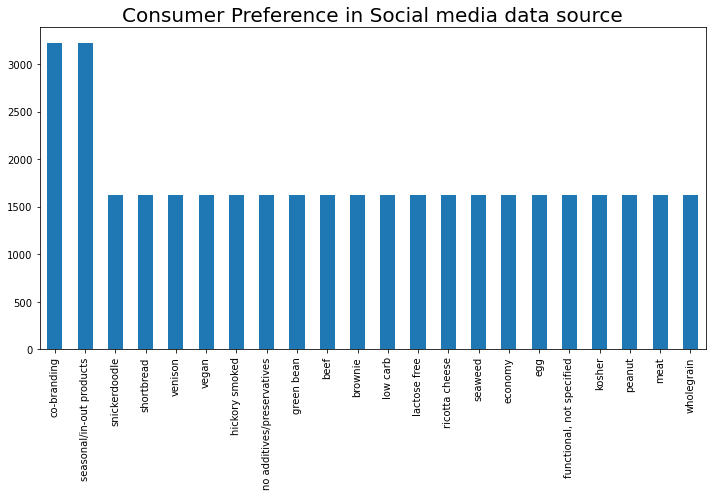

In [65]:
report(social_media_data_theme_mapping, "Social media data source")

*************************** Report on Google search data source ******************************************
Numerical description of the data
         searchVolume       CLAIM_ID    week_number       year_new
count  181565.000000  181565.000000  181565.000000  181565.000000
mean     5823.349318     629.557629      25.169823    2017.013196
std     11251.075181     284.426899      14.613668       1.655898
min         1.000000       8.000000       1.000000    2014.000000
25%       281.000000     516.000000      13.000000    2016.000000
50%      1173.000000     670.000000      25.000000    2017.000000
75%      5539.000000     901.000000      37.000000    2018.000000
max    370484.000000     999.000000      53.000000    2019.000000
***************************************************************************************
Total no of themes available in Google search data source is 160
***************************************************************************************
List of themes across a

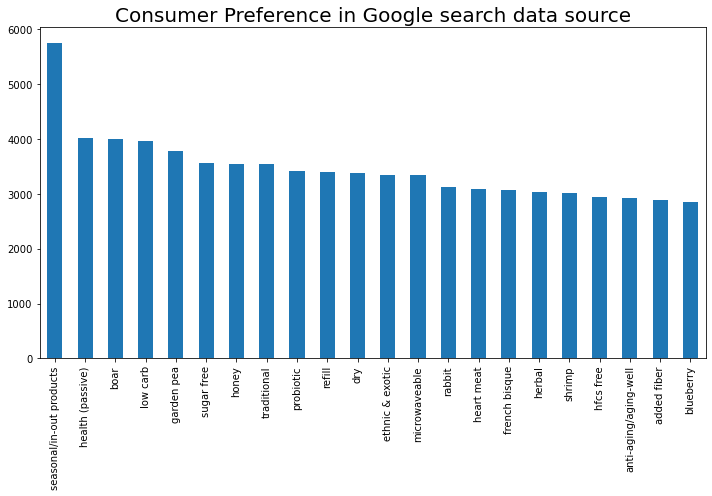

In [66]:
report(google_search_data_theme_mapping, "Google search data source")

# Recommend the time granularity for the analysis

In [67]:
social_media_data_theme_mapping.head()

,CLAIM_ID,published_date,total_post,Claim Name
0,148,10-01-2015,76,tuna
1,148,10-10-2015,31,tuna
2,148,10-11-2015,65,tuna
3,148,10-12-2015,88,tuna
4,148,10/13/2015,85,tuna


In [68]:
social_media_data_theme_mapping["new_published_date"] = pd.to_datetime(social_media_data_theme_mapping['published_date'])

In [69]:
social_media_data_theme_mapping.head()

,CLAIM_ID,published_date,total_post,Claim Name,new_published_date
0,148,10-01-2015,76,tuna,2015-10-01
1,148,10-10-2015,31,tuna,2015-10-10
2,148,10-11-2015,65,tuna,2015-10-11
3,148,10-12-2015,88,tuna,2015-10-12
4,148,10/13/2015,85,tuna,2015-10-13


<AxesSubplot:xlabel='new_published_date'>

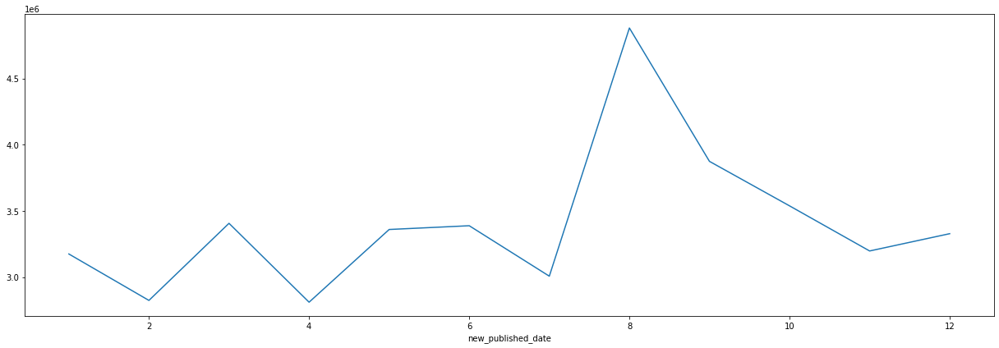

In [70]:
social_media_data_theme_mapping.groupby(by=[social_media_data_theme_mapping["new_published_date"].dt.month])["total_post"].sum().plot(figsize=(17,6))

<AxesSubplot:xlabel='new_published_date'>

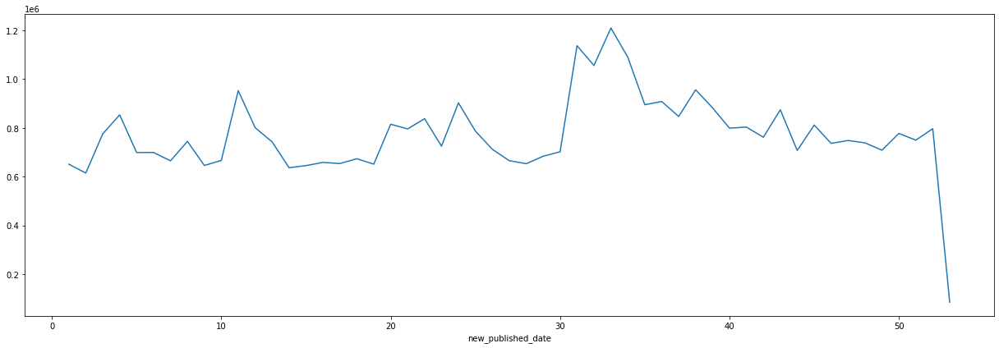

In [71]:
social_media_data_theme_mapping.groupby(by=[social_media_data_theme_mapping["new_published_date"].dt.weekofyear])["total_post"].sum().plot(figsize=(17,6))

<AxesSubplot:xlabel='new_published_date'>

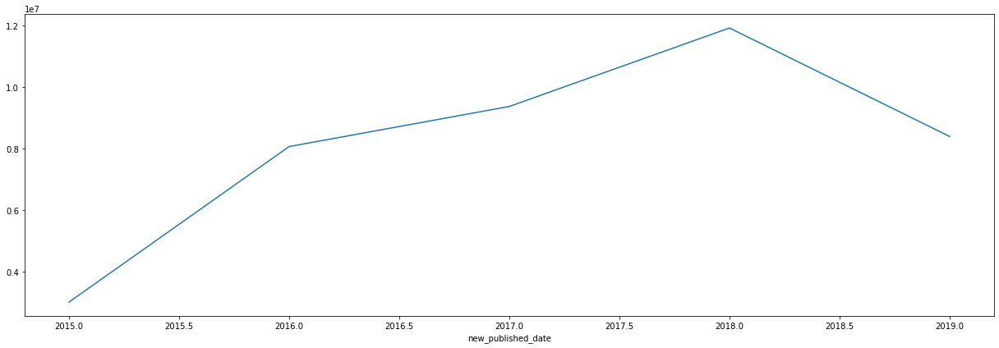

In [72]:
social_media_data_theme_mapping.groupby(by=[social_media_data_theme_mapping["new_published_date"].dt.year])["total_post"].sum().plot(figsize=(17,6))

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:xlabel='Claim Name,new_published_date'>

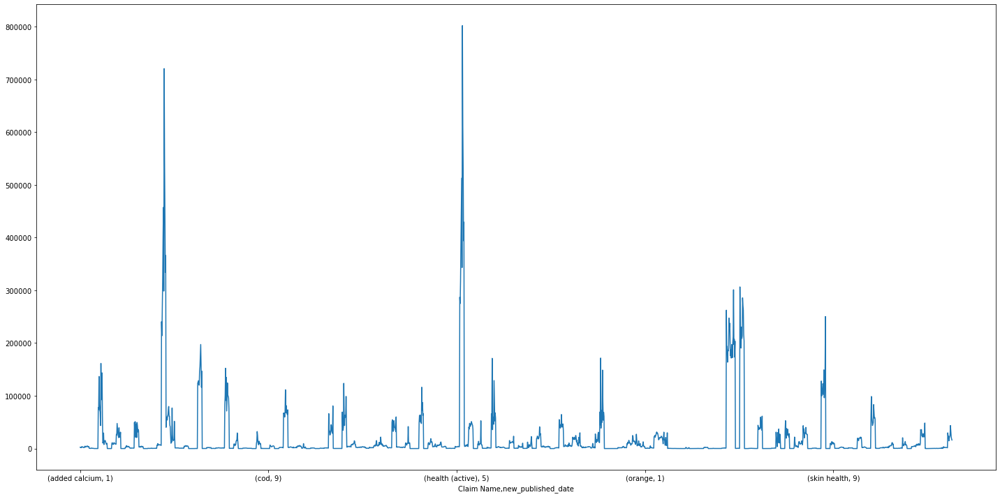

In [73]:
social_media_data_theme_mapping.groupby(by=["Claim Name", social_media_data_theme_mapping["new_published_date"].dt.month])["total_post"].sum().plot(figsize=(20,10))

# Emerging theme across all datasets


In [214]:
google_search_data.head()

,date,platform,searchVolume,CLAIM_ID,week_number,year_new
0,05-01-2014,google,349,916,1,2014
1,06-01-2014,google,349,916,2,2014
2,07-01-2014,google,697,916,2,2014
3,10-01-2014,google,349,916,2,2014
4,20-01-2014,google,697,916,4,2014


In [222]:
# Google Search Data
emerging = google_search_data.groupby(['year_new','CLAIM_ID']).sum()
emerging.drop(['week_number'],axis=1,inplace=True)
emerging.loc[2018,8]

emerging.drop([2014,2015,2016,2017],inplace=True)


emerging2018 = emerging.loc[2018]
emerging2018.reset_index(drop=False,inplace=True)
emerging2018.sort_index( ascending=[False],inplace=True )
emerging2019 = emerging.loc[2019]
emerging2019.reset_index(drop=False,inplace=True)
emerging2019.sort_index( ascending=[False],inplace=True)
# emerging_change = (emerging.loc[2019] - emerging2018)*100/emerging2018
print(emerging2018.head(10))
print(emerging2019.head(10))


final_merge = emerging2019.merge(emerging2018,on='CLAIM_ID',how='left')
#merge_info(emerging2019,emerging2018,final_merge)

final_merge['%_increase_in_searches'] = (final_merge['searchVolume_x'] - final_merge['searchVolume_y'])*100/final_merge['searchVolume_y']

final_merge = theme_list.merge(final_merge,on='CLAIM_ID',how='right')
final_merge.drop(['CLAIM_ID','searchVolume_x','searchVolume_y'],axis=1,inplace=True)
final_merge.sort_values(by= ['%_increase_in_searches'], ascending=[False],inplace=True)
final_merge.head(10)


   CLAIM_ID  searchVolume
0         8       3431254
1        39         18826
2        40           727
3        65        214774
4        75        714642
5        79           979
6        81        343978
7       100        301775
8       120         66445
9       138          8927
   CLAIM_ID  searchVolume
0         8       2544527
1        39         24625
2        40           215
3        65        172777
4        75        562709
5        79           494
6        81        284460
7       100        246943
8       101            12
9       120         49516


,Claim Name,%_increase_in_searches
61,convenience - ready prepared,3000.000000
24,poultry,712.495057
12,fruit,550.000000
116,peanut butter,279.657795
57,coconut,279.098361
110,oral health,195.191298
106,natural,113.461582
49,carob,100.000000
130,seeds,98.214286
115,parsley,91.498741


In [234]:
#Sales _data
sales_df = sales_data.copy()
sales_df['system_calendar_key_N'] = pd.to_datetime(sales_df['system_calendar_key_N'], format='%Y%m%d')
sales_df['year'] = pd.DatetimeIndex(sales_df['system_calendar_key_N']).year

sales_merge_df = theme_product_list.merge(sales_df,on='PRODUCT_ID',how='right')
#merge_info(theme_product_list,sales_data,sales_merge_df)

sales_merge_df = sales_merge_df.groupby(['year','CLAIM_ID']).sum()
sales_merge_df.head(5)

sales_merge_df.drop(['PRODUCT_ID','sales_units_value','sales_lbs_value'],axis=1,inplace=True)

sales_merge_df.drop([2016,2017],inplace=True)

emerging2018 = sales_merge_df.loc[2018]
emerging2018.reset_index(drop=False,inplace=True)
emerging2018.sort_index( ascending=[False],inplace=True )
emerging2019 = sales_merge_df.loc[2019]
emerging2019.reset_index(drop=False,inplace=True)
emerging2019.sort_index( ascending=[False],inplace=True)
# emerging_change = (emerging.loc[2019] - emerging2018)*100/emerging2018


final_merge = emerging2019.merge(emerging2018,on='CLAIM_ID',how='left')
final_merge.head()

final_merge['%_increase_in_sales'] = (final_merge['sales_dollars_value_y'] - final_merge['sales_dollars_value_x'])*100/final_merge['sales_dollars_value_x']
final_merge.head()

,CLAIM_ID,sales_dollars_value_x,sales_dollars_value_y,%_increase_in_sales
0,0,1.207660e+10,1.534391e+10,27.054879
1,8,4.179676e+09,5.343067e+09,27.834501
2,15,1.096227e+08,9.848218e+07,-10.162625
3,16,7.057286e+06,8.550326e+06,21.156008
4,32,2.743869e+09,3.471471e+09,26.517358


In [ ]:
# load datasets
sales_data = load_dataset(context, 'raw/sales_data')
social_media_data = load_dataset(context, 'raw/social_media_data')
google_search_data = load_dataset(context, 'raw/google')
product_manufacturer_list = load_dataset(context, 'raw/product_manufacturer_list')
theme_product_list = load_dataset(context, 'raw/Theme_product_list')
theme_list = load_dataset(context, 'raw/Theme_list')

In [235]:
social_media_data.head()

,CLAIM_ID,published_date,total_post
0,148,10-01-2015,76
1,148,10-10-2015,31
2,148,10-11-2015,65
3,148,10-12-2015,88
4,148,10/13/2015,85


In [236]:
media_df = social_media_data.copy()
media_df['year'] = pd.DatetimeIndex(media_df['published_date']).year

media = media_df.groupby(['year','CLAIM_ID']).sum()

emerging2018 = media.loc[2018]
emerging2018.reset_index(drop=False,inplace=True)
emerging2018.sort_index( ascending=[False],inplace=True )
emerging2019 = media.loc[2019]
emerging2019.reset_index(drop=False,inplace=True)
emerging2019.sort_index( ascending=[False],inplace=True)
# emerging_change = (emerging.loc[2019] - emerging2018)*100/emerging2018
print(emerging2018.head(10))
print(emerging2019.head(10))

final_merge = emerging2019.merge(emerging2018,on='CLAIM_ID',how='left')
final_merge.head()

final_merge['%_increase_in_posts'] = (final_merge['total_post_y'] - final_merge['total_post_x'])*100/final_merge['total_post_x']

final_merge

   CLAIM_ID  total_post
0         8      168008
1        15        3365
2        26          52
3        38        2096
4        39        1573
5        40        6812
6        65       23947
7        75       37129
8        79         574
9        81       19512
   CLAIM_ID  total_post
0         8      106923
1        15        2277
2        26          35
3        38        1415
4        39        1628
5        40        8848
6        65       15080
7        75       22108
8        79         236
9        81       10073


,CLAIM_ID,total_post_x,total_post_y,%_increase_in_posts
0,8,106923,168008,57.129897
1,15,2277,3365,47.782170
2,26,35,52,48.571429
3,38,1415,2096,48.127208
4,39,1628,1573,-3.378378
...,...,...,...,...
188,982,5919,38771,555.026187
189,983,36175,83922,131.988943
190,984,8938,11272,26.113224
191,985,1782,3158,77.216611


# Data exploration and Hypothesis Validation

## Merge the required data sources

In [74]:
#Merging required data sources

product_to_theme_mapping.head()

,PRODUCT_ID,CLAIM_ID,Claim Name
0,26,8,low carb
1,29,8,low carb
2,86,8,low carb
3,87,8,low carb
4,120,8,low carb


##  Understand the overall market share of our client

In [75]:
#First we need to know the products which are manufactured by our client A. We can get this using product_manufacturer_list

product_manufacturer_list.head()

,PRODUCT_ID,Vendor
0,1,Others
1,2,Others
2,3,Others
3,4,Others
4,5,Others


In [76]:
products_by_our_client = product_manufacturer_list[product_manufacturer_list['Vendor'] == 'A']

In [77]:
products_by_our_client.head()

,PRODUCT_ID,Vendor
571,572,A
572,573,A
573,574,A
574,575,A
575,576,A


In [78]:
#Now merging products_by_our_client with sales_data

product_market_of_our_client = pd.merge(products_by_our_client, sales_data, on='PRODUCT_ID')
product_market_of_our_client

,PRODUCT_ID,Vendor,system_calendar_key_N,sales_dollars_value,sales_units_value,sales_lbs_value
0,573,A,20160402,0.0,1,1
1,573,A,20170204,0.0,4,3
2,573,A,20170429,0.0,1,1
3,573,A,20170506,0.0,1,1
4,573,A,20180310,0.0,1,1
...,...,...,...,...,...,...
500911,56804,A,20190907,2139.0,124,496
500912,56804,A,20190914,1981.0,115,460
500913,56804,A,20190921,2254.0,130,520
500914,56804,A,20190928,2604.0,153,612


In [79]:
market_share_of_our_client = (sum(product_market_of_our_client['sales_dollars_value']) / sum(sales_data['sales_dollars_value'])) * 100 

In [80]:
market_share_of_our_client

31.64700563323608

In [81]:
print("Overall market share of our client A is {}%".format(round(market_share_of_our_client, 2)))

Overall market share of our client A is 31.65%


## Finding the potential competitors for our client based on market share

In [82]:
def market_share(vendor):
    
    products_by_vendor = product_manufacturer_list[product_manufacturer_list['Vendor'] == vendor]
    
    product_market_of_vendor = pd.merge(products_by_vendor, sales_data, on='PRODUCT_ID')
    
    market_share_of_vendor = (sum(product_market_of_vendor['sales_dollars_value']) / sum(sales_data['sales_dollars_value'])) * 100 
    
    return round(market_share_of_vendor, 2)

In [83]:
list_of_vendors = product_manufacturer_list['Vendor'].unique()
list_of_vendors

array(['Others', 'B', 'A', 'D', 'E', 'Private Label', 'F', 'G', 'H'],
      dtype=object)

In [84]:
#competitors of our client based on market share

for i in list_of_vendors:
    market_share_of_i = market_share(i)
    print("The market share of vendor {} is {}%".format(i, market_share_of_i))

The market share of vendor Others is 18.97%
The market share of vendor B is 15.74%
The market share of vendor A is 31.65%
The market share of vendor D is 12.24%
The market share of vendor E is 1.98%
The market share of vendor Private Label is 9.98%
The market share of vendor F is 5.11%
The market share of vendor G is 2.0%
The market share of vendor H is 2.33%


In [85]:
## we can see that vendors B, D and others are potential competitors for our client based on market share

## Finding the potential competitors for our client in each theme

In [86]:
sales_data_product_to_theme_mapping.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name
0,20160109,1,13927.0,934,18680,0,No Claim
1,20160123,1,12628.0,878,17564,0,No Claim
2,20160206,1,11379.0,810,16200,0,No Claim
3,20160130,1,11568.0,821,16424,0,No Claim
4,20160213,1,10959.0,784,15682,0,No Claim


In [87]:
final_sales_of_our_client = pd.merge(sales_data_product_to_theme_mapping, products_by_our_client, on='PRODUCT_ID')

In [88]:
final_sales_of_our_client = final_sales_of_our_client.sort_values('Claim Name')

In [89]:
final_sales_of_our_client

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,Vendor
0,20160109,587,156606.0,40400,161603,0,No Claim,A
405712,20170819,14139,951.0,52,351,0,No Claim,A
405711,20170812,14139,918.0,49,331,0,No Claim,A
405710,20170805,14139,949.0,52,351,0,No Claim,A
405709,20170729,14139,1310.0,70,473,0,No Claim,A
...,...,...,...,...,...,...,...,...
799094,20181020,6781,1089.0,47,282,437,vegetarian,A
799238,20190629,6781,1162.0,48,288,437,vegetarian,A
771385,20190511,6780,980.0,56,168,437,vegetarian,A
799234,20190622,6781,1115.0,47,282,437,vegetarian,A


In [90]:
common_claims = final_sales_of_our_client['Claim Name'].unique()

In [91]:
common_claims

array(['No Claim', 'american gumbo', 'american southwest style',
       'apple cinnamon', 'beans', 'beef hamburger', 'blueberry',
       'brown ale', 'buckwheat', 'chicken', 'cookie', 'crab',
       'ethical - packaging', 'ethnic & exotic', 'french bisque',
       'gingerbread', 'gmo free', 'herbs', 'high/source of protein',
       'low carb', 'low sodium', 'low sugar',
       'no additives/preservatives', 'pizza', 'pollock', 'poultry',
       'salmon', 'soy foods', 'stroganoff', 'tilapia', 'tuna',
       'vegetarian'], dtype=object)

In [92]:
products_by_remaining_vendors = product_manufacturer_list[product_manufacturer_list['Vendor'] != 'A']

In [93]:
products_by_remaining_vendors.head()

,PRODUCT_ID,Vendor
0,1,Others
1,2,Others
2,3,Others
3,4,Others
4,5,Others


In [94]:
final_sales_of_remaining_vendors = pd.merge(sales_data_product_to_theme_mapping, products_by_remaining_vendors, on='PRODUCT_ID')

In [95]:
final_sales_of_remaining_vendors = final_sales_of_remaining_vendors.sort_values('Claim Name')

In [96]:
final_sales_of_remaining_vendors

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,Vendor
0,20160109,1,13927.0,934,18680,0,No Claim,Others
3505941,20160917,21029,13765.0,4523,2200,0,No Claim,D
3505942,20160924,21029,14114.0,4652,2262,0,No Claim,D
3505943,20161001,21029,14083.0,4457,2168,0,No Claim,D
3505944,20161008,21029,13265.0,4159,2023,0,No Claim,D
...,...,...,...,...,...,...,...,...
3803859,20160618,22365,1197.0,39,696,437,vegetarian,Others
3803865,20160625,22365,399.0,13,232,437,vegetarian,Others
4217192,20190921,22469,33172.0,584,17522,437,vegetarian,Others
3803841,20160528,22365,798.0,26,464,437,vegetarian,Others


In [97]:
final_sales_of_common_claims_of_remaining_vendors = final_sales_of_remaining_vendors[final_sales_of_remaining_vendors['Claim Name'].isin(common_claims)]

In [98]:
final_sales_of_common_claims_of_remaining_vendors

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,Vendor
0,20160109,1,13927.0,934,18680,0,No Claim,Others
3505941,20160917,21029,13765.0,4523,2200,0,No Claim,D
3505942,20160924,21029,14114.0,4652,2262,0,No Claim,D
3505943,20161001,21029,14083.0,4457,2168,0,No Claim,D
3505944,20161008,21029,13265.0,4159,2023,0,No Claim,D
...,...,...,...,...,...,...,...,...
3803859,20160618,22365,1197.0,39,696,437,vegetarian,Others
3803865,20160625,22365,399.0,13,232,437,vegetarian,Others
4217192,20190921,22469,33172.0,584,17522,437,vegetarian,Others
3803841,20160528,22365,798.0,26,464,437,vegetarian,Others


In [99]:
#final_sales_data_with_vendors = pd.merge(sales_data_product_to_theme_mapping, product_manufacturer_list, on='PRODUCT_ID')

In [100]:
print("overall sales ", sales_data_product_to_theme_mapping["sales_dollars_value"].sum())
print("overall sales by themes ", sales_data_product_to_theme_mapping.groupby("Claim Name")["sales_dollars_value"].sum().sort_values(ascending=False))

overall sales  151993721528.0
overall sales by themes  Claim Name
No Claim                         5.876714e+10
low carb                         1.862566e+10
no additives/preservatives       1.438821e+10
stroganoff                       1.275780e+10
apple cinnamon                   8.094533e+09
pollock                          7.007307e+09
cookie                           4.254113e+09
pizza                            4.254113e+09
gmo free                         3.859459e+09
blueberry                        3.137485e+09
american southwest style         3.137485e+09
ethnic & exotic                  2.806207e+09
salmon                           2.400092e+09
soy foods                        2.377886e+09
buckwheat                        1.465495e+09
crab                             8.559114e+08
low calorie                      7.389844e+08
low sodium                       5.903028e+08
herbs                            3.842909e+08
chicken                          3.218462e+08
beans         

In [101]:
final_sales_of_our_client.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,Vendor
0,20160109,587,156606.0,40400,161603,0,No Claim,A
405712,20170819,14139,951.0,52,351,0,No Claim,A
405711,20170812,14139,918.0,49,331,0,No Claim,A
405710,20170805,14139,949.0,52,351,0,No Claim,A
405709,20170729,14139,1310.0,70,473,0,No Claim,A


In [102]:
client_A = final_sales_of_our_client.groupby(["Claim Name"])["sales_dollars_value"].mean()

In [103]:
client_A

Claim Name
No Claim                       87908.895384
american gumbo                  4021.856250
american southwest style       27212.384703
apple cinnamon                 25880.518278
beans                           4641.408654
beef hamburger                   525.692607
blueberry                      27212.384703
brown ale                       4097.283422
buckwheat                      24238.263187
chicken                        21434.666845
cookie                         36163.861951
crab                            5745.147597
ethical - packaging            24898.587500
ethnic & exotic                31945.309548
french bisque                   2129.696136
gingerbread                     7276.859186
gmo free                        5733.987586
herbs                          31981.572646
high/source of protein         14128.118685
low carb                       15692.304940
low sodium                     12838.056263
low sugar                      19005.046512
no additives/preserva

In [104]:
clients_remaining = final_sales_of_remaining_vendors.groupby(["Claim Name", "Vendor"])["sales_dollars_value"].mean()

In [105]:
clients_remaining

Claim Name  Vendor
No Claim    B         56473.977621
            D         53247.453889
            E         86181.821483
            F         12439.675292
            G         86227.455719
                          ...     
stroganoff  Others    15734.789486
tilapia     Others      809.969640
vegetarian  B         12601.533797
            H           271.525424
            Others     7953.193317
Name: sales_dollars_value, Length: 165, dtype: float64

In [106]:
b = clients_remaining.groupby(level=0).nlargest(3)

In [107]:
b

Claim Name      Claim Name      Vendor       
No Claim        No Claim        G                86227.455719
                                E                86181.821483
                                B                56473.977621
american gumbo  american gumbo  Private Label    18583.410758
                                F                16763.669780
                                                     ...     
stroganoff      stroganoff      F                44588.543890
tilapia         tilapia         Others             809.969640
vegetarian      vegetarian      B                12601.533797
                                Others            7953.193317
                                H                  271.525424
Name: sales_dollars_value, Length: 108, dtype: float64

In [108]:
final_clients_remaining = b.droplevel(0)

In [109]:
final_clients_remaining

Claim Name      Vendor       
No Claim        G                86227.455719
                E                86181.821483
                B                56473.977621
american gumbo  Private Label    18583.410758
                F                16763.669780
                                     ...     
stroganoff      F                44588.543890
tilapia         Others             809.969640
vegetarian      B                12601.533797
                Others            7953.193317
                H                  271.525424
Name: sales_dollars_value, Length: 108, dtype: float64

<AxesSubplot:title={'center':'Average Sales of each claim of our client A'}, xlabel='Claim Name'>

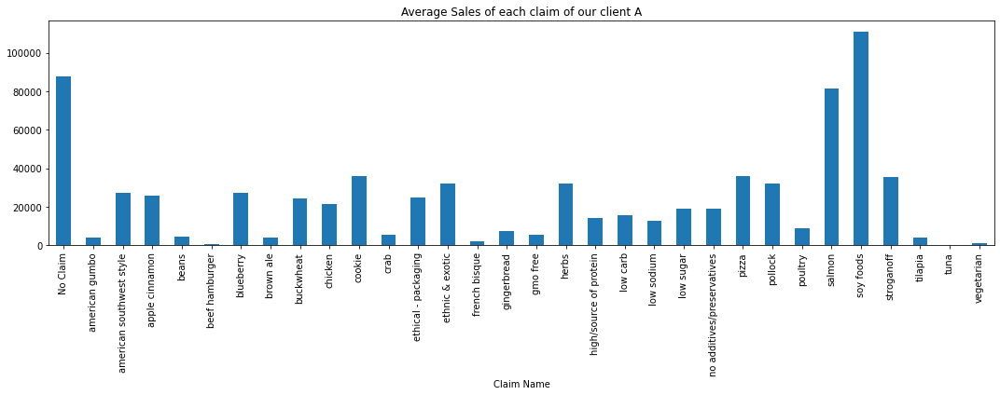

In [110]:
client_A[:].plot(kind="bar", figsize=(15, 6), title='Average Sales of each claim of our client A')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim'}, xlabel='Claim Name,Vendor'>

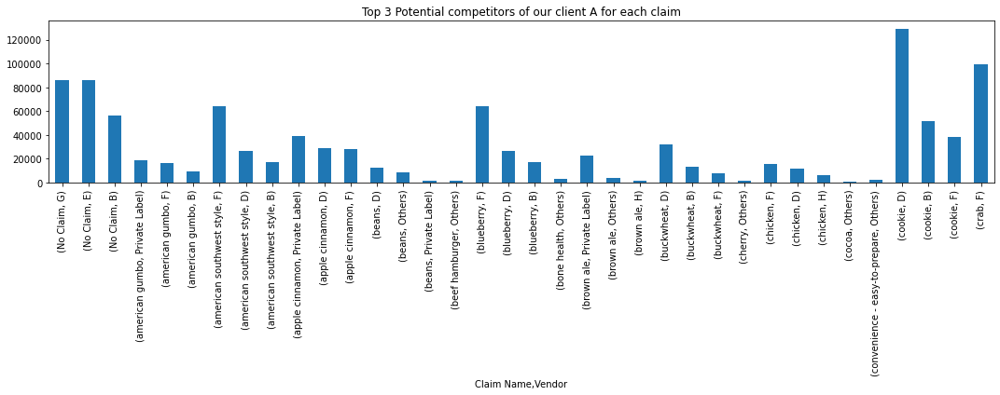

In [111]:
final_clients_remaining[:36].plot(kind="bar", figsize=(15, 6), title='Top 3 Potential competitors of our client A for each claim')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim'}, xlabel='Claim Name,Vendor'>

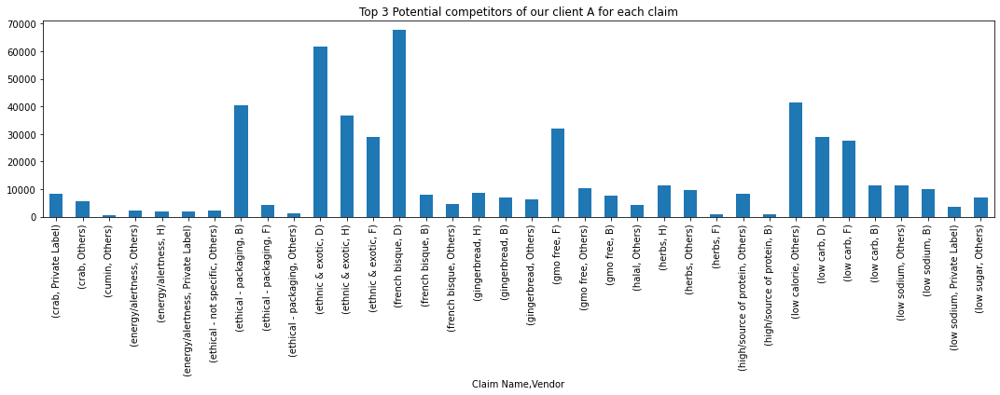

In [112]:
final_clients_remaining[36:72].plot(kind="bar", figsize=(15, 6), title='Top 3 Potential competitors of our client A for each claim')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim'}, xlabel='Claim Name,Vendor'>

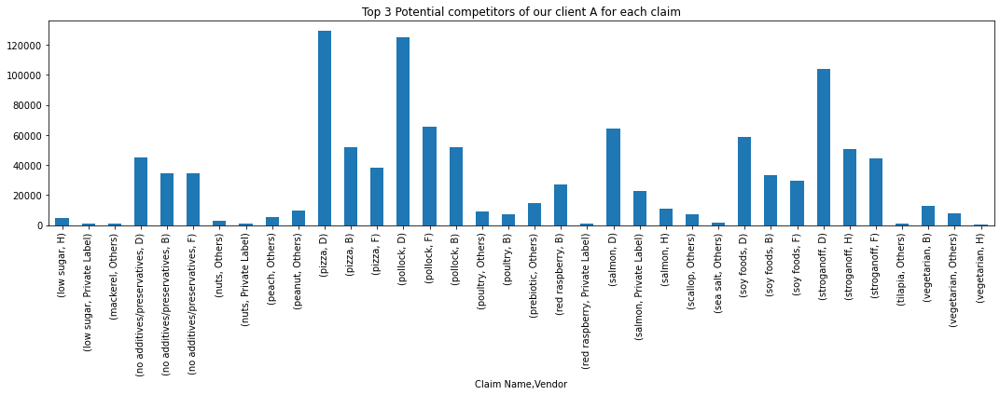

In [113]:
final_clients_remaining[72:].plot(kind="bar", figsize=(15, 6), title='Top 3 Potential competitors of our client A for each claim')

## Finding potential competitors of our client A year wise

In [114]:
final_sales_of_our_client.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,Vendor
0,20160109,587,156606.0,40400,161603,0,No Claim,A
405712,20170819,14139,951.0,52,351,0,No Claim,A
405711,20170812,14139,918.0,49,331,0,No Claim,A
405710,20170805,14139,949.0,52,351,0,No Claim,A
405709,20170729,14139,1310.0,70,473,0,No Claim,A


In [115]:
final_sales_of_our_client['calender_key'] = pd.to_datetime(final_sales_of_our_client['system_calendar_key_N'], format='%Y%m%d')

In [116]:
final_sales_of_our_client.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,Vendor,calender_key
0,20160109,587,156606.0,40400,161603,0,No Claim,A,2016-01-09
405712,20170819,14139,951.0,52,351,0,No Claim,A,2017-08-19
405711,20170812,14139,918.0,49,331,0,No Claim,A,2017-08-12
405710,20170805,14139,949.0,52,351,0,No Claim,A,2017-08-05
405709,20170729,14139,1310.0,70,473,0,No Claim,A,2017-07-29


In [117]:
c_a = final_sales_of_our_client.groupby([final_sales_of_our_client['calender_key'].dt.year, 'Claim Name'])['sales_dollars_value'].mean()

In [118]:
c_a

calender_key  Claim Name              
2016          No Claim                     90308.017023
              american gumbo                3168.150259
              american southwest style     30891.616564
              apple cinnamon               27251.681593
              beans                         6096.893939
                                              ...      
2019          salmon                       68441.730442
              soy foods                   106604.317042
              stroganoff                   29346.314717
              tilapia                       4284.919786
              vegetarian                    1275.800000
Name: sales_dollars_value, Length: 120, dtype: float64

In [119]:
c_b = c_a.to_frame().reset_index()

In [120]:
c_c = c_b.groupby('calender_key')

In [121]:
years = [2016, 2017, 2018, 2019]

In [122]:
def year_wise_claim_sales_of_A(years):
    fig, ax = plt.subplots(figsize=(15, 8))
    #scale_factor = 5
    #ymin, ymax = ax.ylim()
    for i in range(len(years)):
        #ax = ax.ravel()
        c_d = c_c.get_group(years[i])
        ax.scatter(c_d['Claim Name'], c_d['sales_dollars_value'], marker=".", linewidths=3)
        ax.set_xlabel("Claims")
        ax.set_ylabel("Average sales")
        #ax.set_ylim([0, 15000])
        ax.tick_params(axis='x', labelrotation = 90)
        ax.legend(years)
        #ax.ylim(ymin * scale_factor, ymax * scale_factor)
        #ax.set_xticklabels(c_d['Claim Name'], rotation = 90)

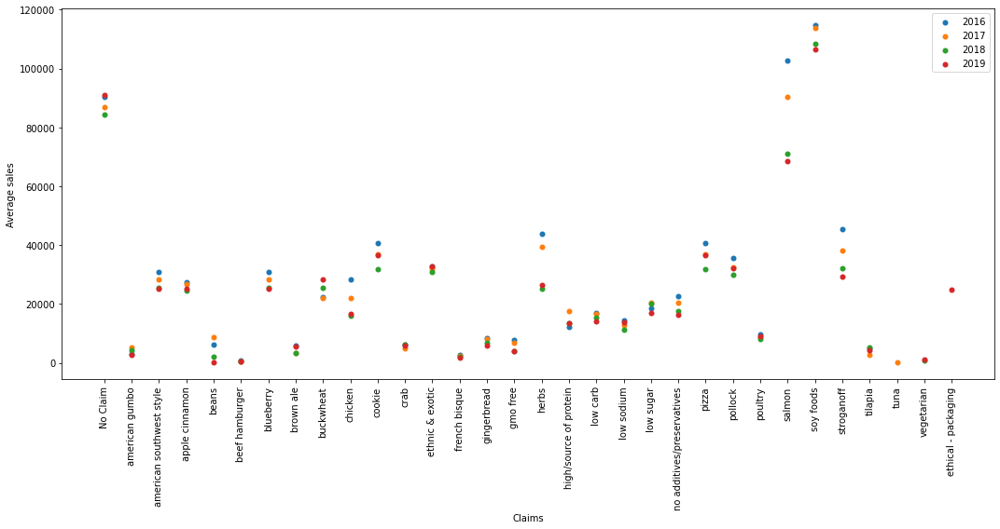

In [123]:
year_wise_claim_sales_of_A(years)

In [124]:
def year_wise_claim_sales_of_our_client(years):
    colors = ['red', 'green', 'blue', 'orange']
    for i in range(len(years)):
        fig = plt.figure(figsize = (10, 5))
        c_d = c_c.get_group(years[i])
        #plt.bar(c_d['Claim Name'], c_d['sales_dollars_value'])
        plt.bar(c_d['Claim Name'], c_d['sales_dollars_value'], color=colors[i])
        plt.xlabel("Claims", )
        plt.ylabel("Average sales")
        plt.title("Sales of claims of our client A in the year " + str(years[i]))
        plt.tick_params(axis='x', labelrotation = 90)
        plt.legend([years[i]])
        plt.show()

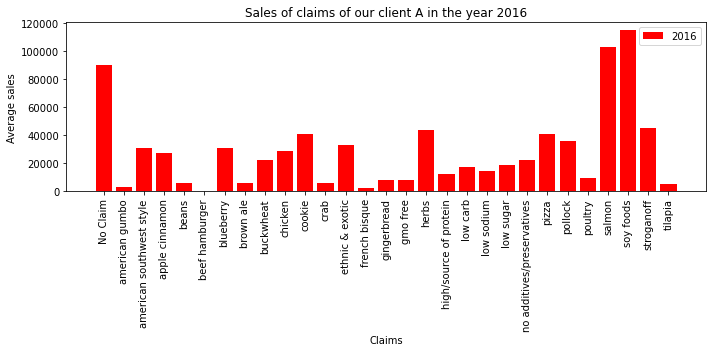

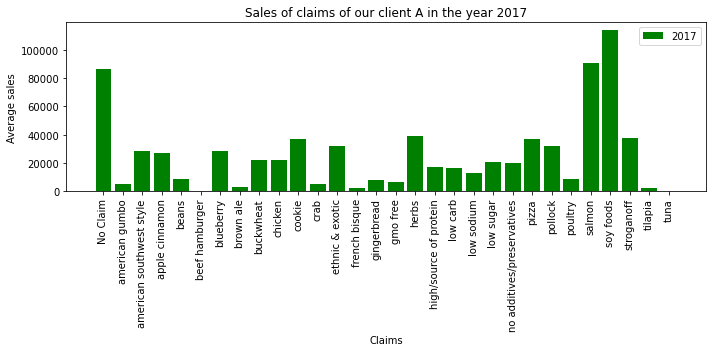

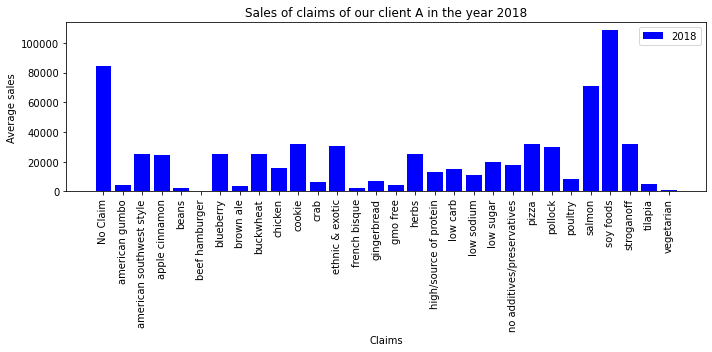

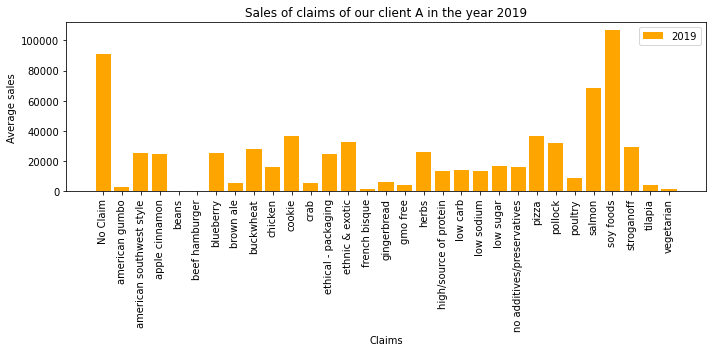

In [125]:
year_wise_claim_sales_of_our_client(years)

In [126]:
final_sales_of_remaining_vendors.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,Vendor
0,20160109,1,13927.0,934,18680,0,No Claim,Others
3505941,20160917,21029,13765.0,4523,2200,0,No Claim,D
3505942,20160924,21029,14114.0,4652,2262,0,No Claim,D
3505943,20161001,21029,14083.0,4457,2168,0,No Claim,D
3505944,20161008,21029,13265.0,4159,2023,0,No Claim,D


In [127]:
final_sales_of_remaining_vendors['calender_key'] = pd.to_datetime(final_sales_of_remaining_vendors['system_calendar_key_N'], format='%Y%m%d')

In [128]:
final_sales_of_remaining_vendors.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,Vendor,calender_key
0,20160109,1,13927.0,934,18680,0,No Claim,Others,2016-01-09
3505941,20160917,21029,13765.0,4523,2200,0,No Claim,D,2016-09-17
3505942,20160924,21029,14114.0,4652,2262,0,No Claim,D,2016-09-24
3505943,20161001,21029,14083.0,4457,2168,0,No Claim,D,2016-10-01
3505944,20161008,21029,13265.0,4159,2023,0,No Claim,D,2016-10-08


In [129]:
r_a = final_sales_of_remaining_vendors.groupby([final_sales_of_remaining_vendors['calender_key'].dt.year, 'Claim Name', 'Vendor'])['sales_dollars_value'].mean()

In [130]:
r_a

calender_key  Claim Name  Vendor
2016          No Claim    B         52793.219236
                          D         54165.330119
                          E         77833.168675
                          F         15027.598035
                          G         86356.640055
                                        ...     
2019          stroganoff  Others    15295.266829
              tilapia     Others      659.036403
              vegetarian  B         15284.669975
                          H           301.729730
                          Others    15041.244058
Name: sales_dollars_value, Length: 627, dtype: float64

In [131]:
r_b = r_a.to_frame().reset_index()

In [132]:
r_c = r_b.groupby('calender_key')

In [133]:
r_c.first()

,Claim Name,Vendor,sales_dollars_value
calender_key,,,
2016,No Claim,B,52793.219236
2017,No Claim,B,53902.948645
2018,No Claim,B,57946.921509
2019,No Claim,B,63654.730484


In [134]:
r_d = r_a.groupby(level=[0, 1]).nlargest(3)

In [135]:
r_d

calender_key  Claim Name      calender_key  Claim Name      Vendor       
2016          No Claim        2016          No Claim        G                86356.640055
                                                            E                77833.168675
                                                            D                54165.330119
              american gumbo  2016          american gumbo  Private Label    15780.484507
                                                            F                14852.193966
                                                                                 ...     
2019          stroganoff      2019          stroganoff      F                43154.497780
              tilapia         2019          tilapia         Others             659.036403
              vegetarian      2019          vegetarian      B                15284.669975
                                                            Others           15041.244058
                          

In [136]:
r_e = r_d.droplevel([0, 1])

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019'}, xlabel='calender_key,Claim Name,Vendor'>

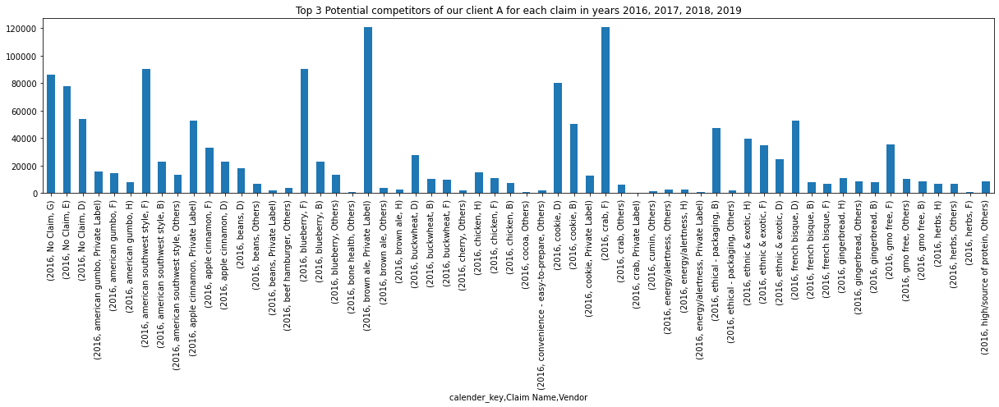

In [137]:
r_e[:60].plot(kind="bar", figsize=(17, 7), title='Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019'}, xlabel='calender_key,Claim Name,Vendor'>

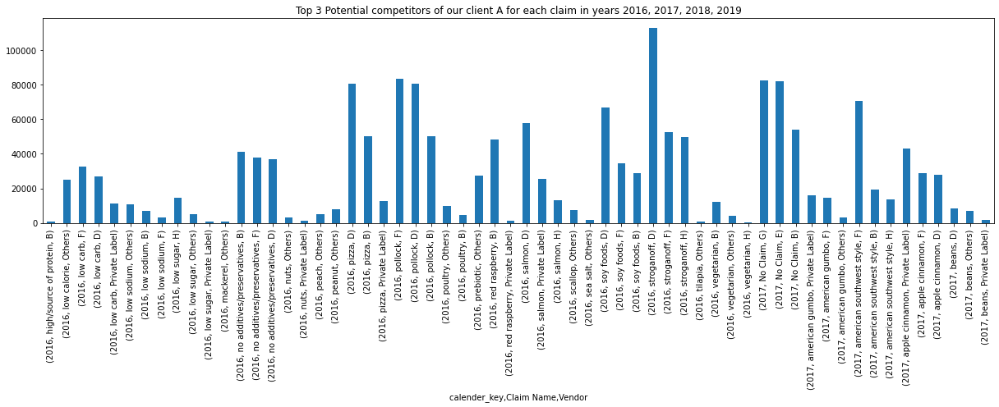

In [138]:
r_e[60:120].plot(kind="bar", figsize=(17, 7), title='Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019'}, xlabel='calender_key,Claim Name,Vendor'>

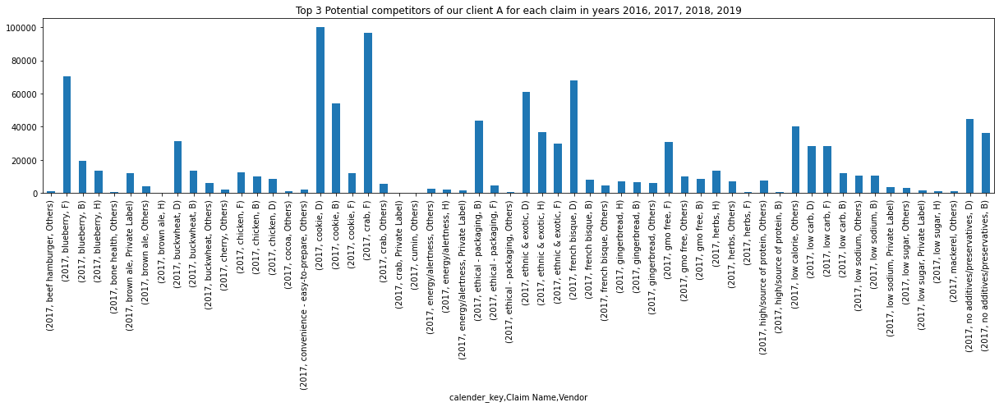

In [139]:
r_e[120:180].plot(kind="bar", figsize=(17, 7), title='Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019'}, xlabel='calender_key,Claim Name,Vendor'>

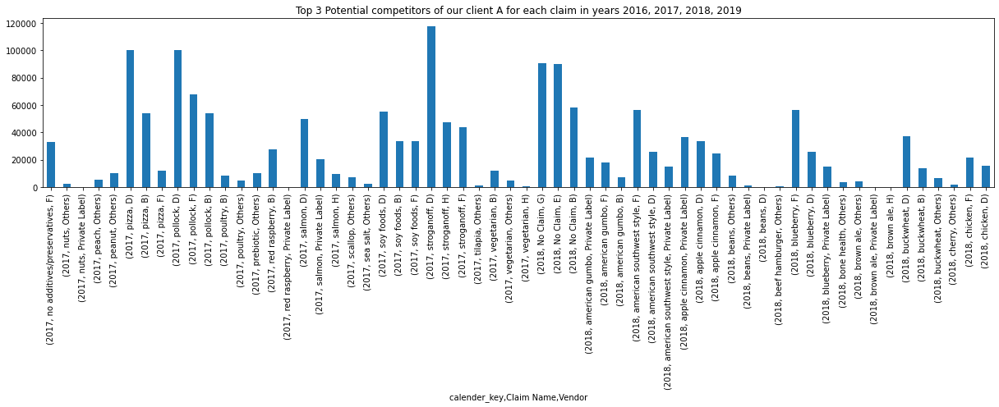

In [140]:
r_e[180:240].plot(kind="bar", figsize=(17, 7), title='Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019'}, xlabel='calender_key,Claim Name,Vendor'>

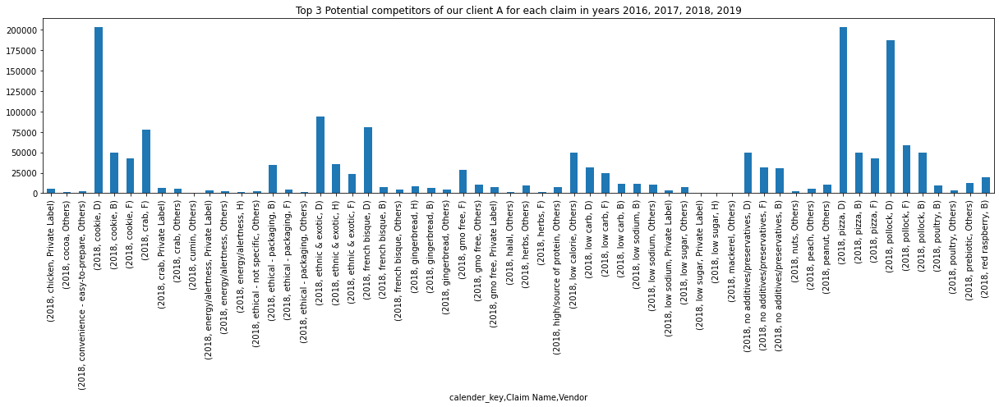

In [141]:
r_e[240:300].plot(kind="bar", figsize=(17, 7), title='Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019'}, xlabel='calender_key,Claim Name,Vendor'>

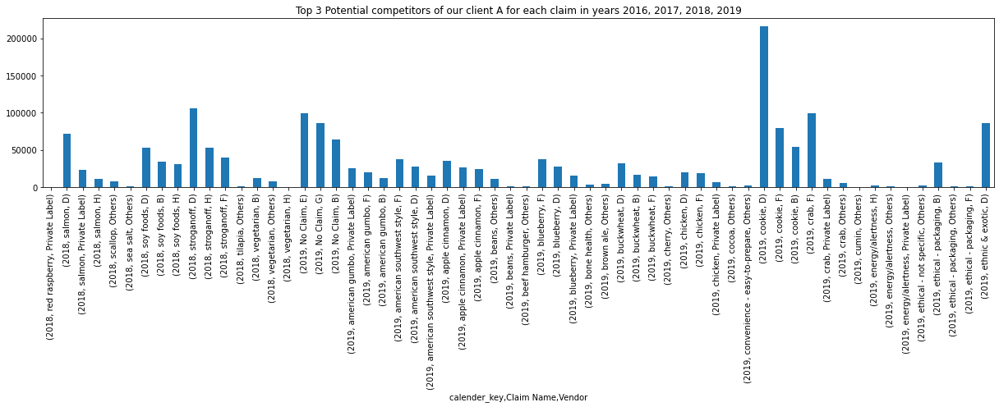

In [142]:
r_e[300:360].plot(kind="bar", figsize=(17, 7), title='Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019')

<AxesSubplot:title={'center':'Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019'}, xlabel='calender_key,Claim Name,Vendor'>

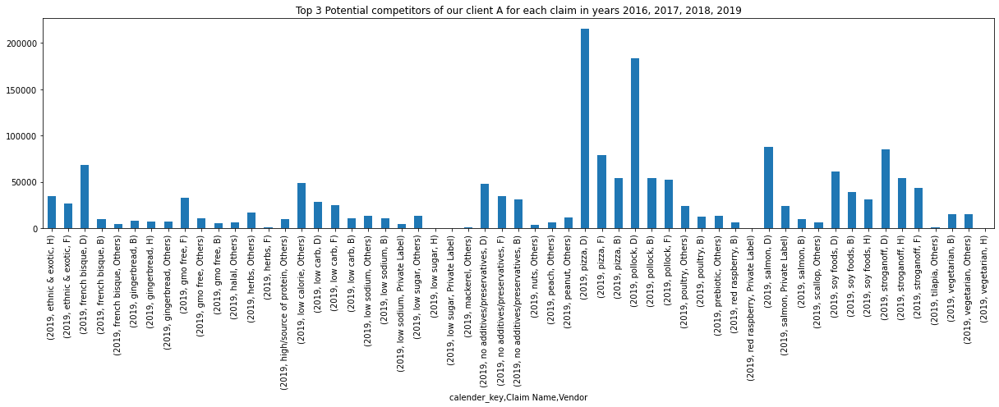

In [143]:
r_e[360:].plot(kind="bar", figsize=(17, 7), title='Top 3 Potential competitors of our client A for each claim in years 2016, 2017, 2018, 2019')

## What are the themes which are emerging in social media, Google Search & Sales?

In [144]:
sales_data_product_to_theme_mapping.head(2)

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name
0,20160109,1,13927.0,934,18680,0,No Claim
1,20160123,1,12628.0,878,17564,0,No Claim


In [145]:
social_media_data_theme_mapping.head(2)

,CLAIM_ID,published_date,total_post,Claim Name,new_published_date
0,148,10-01-2015,76,tuna,2015-10-01
1,148,10-10-2015,31,tuna,2015-10-10


In [146]:
google_search_data_theme_mapping.head(2)

,date,platform,searchVolume,CLAIM_ID,week_number,year_new,Claim Name
0,05-01-2014,google,349,916,1,2014,gluten free
1,06-01-2014,google,349,916,2,2014,gluten free


In [147]:
sales_data_product_to_theme_mapping["Claim Name"].value_counts().loc[common_themes_btw_sales_and_social].sort_values(ascending=False)

low carb                         1668808
no additives/preservatives        826406
blueberry                         218897
gmo free                          215635
ethnic & exotic                   132719
crab                              129212
salmon                             84542
chicken                            73382
low sodium                         60132
soy foods                          55961
french bisque                      42655
beans                              35758
herbs                              26954
high/source of protein             24818
gingerbread                        22113
low calorie                        17795
nuts                               16617
vegetarian                         12152
american gumbo                     11514
ethical - packaging                10967
poultry                             8539
convenience - easy-to-prepare       8208
scallop                             7016
low sugar                           6117
energy/alertness

In [148]:
google_map = google_search_data_theme_mapping.groupby("Claim Name")["searchVolume"].mean()

In [149]:
google_map

Claim Name
added calcium                 159.120968
added fiber                  1811.947423
added iron                    581.408475
added protein                 380.384615
allergy                      1344.825569
                                ...     
vitamin/mineral fortified    1166.962329
weight management             405.419444
white cheddar cheese            3.000000
wholegrain                   1325.748120
yogurt                        843.496728
Name: searchVolume, Length: 160, dtype: float64

In [150]:
media_map = social_media_data_theme_mapping.groupby("Claim Name")["total_post"].mean()

In [151]:
media_map

Claim Name
added calcium                 18.163955
added fiber                   29.321026
added iron                     3.792240
added protein                  0.428661
allergy                      702.033187
                                ...    
vitamin/mineral fortified      1.580100
weight management              2.097622
white cheddar cheese           5.063830
wholegrain                    15.560000
yogurt                       179.736000
Name: total_post, Length: 193, dtype: float64

In [152]:
media_map.sort_values(ascending=False)[:20]

Claim Name
health (passive)                 3527.195235
boar                             3050.565850
rabbit                           1736.424615
probiotic                        1515.518769
pumpkin                          1487.403692
caramel                          1052.984615
shrimp                            949.186462
cheese                            755.115077
allergy                           702.033187
microwaveable                     571.217231
hfcs free                         536.167385
convenience - easy-to-prepare     533.591385
garden pea                        523.581734
dry                               460.989538
sugar free                        453.363077
bone health                       435.188986
low carb                          329.786462
heart meat                        326.844923
ethnic & exotic                   324.756923
refill                            313.340923
Name: total_post, dtype: float64

In [153]:
sales_data_product_to_theme_mapping["totalposts"] = sales_data_product_to_theme_mapping["Claim Name"].map(dict(media_map))

In [154]:
sales_data_product_to_theme_mapping

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,totalposts
0,20160109,1,13927.0,934,18680,0,No Claim,NaN
1,20160123,1,12628.0,878,17564,0,No Claim,NaN
2,20160206,1,11379.0,810,16200,0,No Claim,NaN
3,20160130,1,11568.0,821,16424,0,No Claim,NaN
4,20160213,1,10959.0,784,15682,0,No Claim,NaN
...,...,...,...,...,...,...,...,...
7767415,20191005,56817,699.0,37,129,0,No Claim,NaN
7767416,20191005,56818,486.0,7,158,0,No Claim,NaN
7767417,20191005,56924,53.0,3,16,8,low carb,329.786462
7767418,20191005,57045,6.0,1,7,0,No Claim,NaN


In [155]:
sales_data_product_to_theme_mapping["searchvolume"] = sales_data_product_to_theme_mapping["Claim Name"].map(dict(google_map))

In [156]:
sales_data_product_to_theme_mapping["searchvolume"].fillna(sales_data_product_to_theme_mapping["searchvolume"].mean(), inplace=True)

In [157]:
sales_data_product_to_theme_mapping["totalposts"].fillna(sales_data_product_to_theme_mapping["totalposts"].mean(), inplace=True)

<AxesSubplot:xlabel='totalposts'>

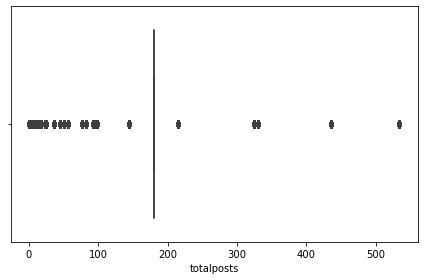

In [158]:
sns.boxplot(sales_data_product_to_theme_mapping["totalposts"])

<AxesSubplot:xlabel='searchvolume'>

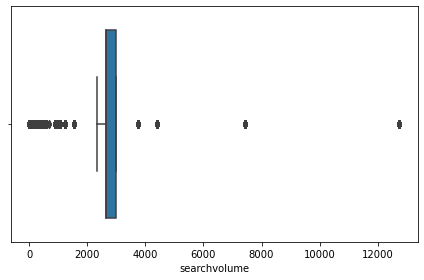

In [159]:
sns.boxplot(sales_data_product_to_theme_mapping["searchvolume"])

In [160]:
final_data = sales_data_product_to_theme_mapping.drop(columns=["Claim Name", "CLAIM_ID", "PRODUCT_ID", "system_calendar_key_N"])

In [161]:
sales_data_product_to_theme_mapping.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,totalposts,searchvolume
0,20160109,1,13927.0,934,18680,0,No Claim,180.593046,2656.600568
1,20160123,1,12628.0,878,17564,0,No Claim,180.593046,2656.600568
2,20160206,1,11379.0,810,16200,0,No Claim,180.593046,2656.600568
3,20160130,1,11568.0,821,16424,0,No Claim,180.593046,2656.600568
4,20160213,1,10959.0,784,15682,0,No Claim,180.593046,2656.600568


In [162]:
final_data.head()

,sales_dollars_value,sales_units_value,sales_lbs_value,totalposts,searchvolume
0,13927.0,934,18680,180.593046,2656.600568
1,12628.0,878,17564,180.593046,2656.600568
2,11379.0,810,16200,180.593046,2656.600568
3,11568.0,821,16424,180.593046,2656.600568
4,10959.0,784,15682,180.593046,2656.600568


In [163]:
google_search_data_theme_mapping.head()

,date,platform,searchVolume,CLAIM_ID,week_number,year_new,Claim Name
0,05-01-2014,google,349,916,1,2014,gluten free
1,06-01-2014,google,349,916,2,2014,gluten free
2,07-01-2014,google,697,916,2,2014,gluten free
3,10-01-2014,google,349,916,2,2014,gluten free
4,20-01-2014,google,697,916,4,2014,gluten free


In [164]:
social_media_data_theme_mapping.head()

,CLAIM_ID,published_date,total_post,Claim Name,new_published_date
0,148,10-01-2015,76,tuna,2015-10-01
1,148,10-10-2015,31,tuna,2015-10-10
2,148,10-11-2015,65,tuna,2015-10-11
3,148,10-12-2015,88,tuna,2015-10-12
4,148,10/13/2015,85,tuna,2015-10-13


In [165]:
google_search_data_theme_mapping['new_date'] = pd.to_datetime(google_search_data_theme_mapping['date'])

In [166]:
google_search_data_theme_mapping['gmonth'] = google_search_data_theme_mapping['new_date'].dt.month

In [167]:
google_search_data_theme_mapping.head()

,date,platform,searchVolume,CLAIM_ID,week_number,year_new,Claim Name,new_date,gmonth
0,05-01-2014,google,349,916,1,2014,gluten free,2014-05-01,5
1,06-01-2014,google,349,916,2,2014,gluten free,2014-06-01,6
2,07-01-2014,google,697,916,2,2014,gluten free,2014-07-01,7
3,10-01-2014,google,349,916,2,2014,gluten free,2014-10-01,10
4,20-01-2014,google,697,916,4,2014,gluten free,2014-01-20,1


In [168]:
social_media_data_theme_mapping['syear'] = social_media_data_theme_mapping['new_published_date'].dt.year

In [169]:
social_media_data_theme_mapping['smonth'] = social_media_data_theme_mapping['new_published_date'].dt.month

In [170]:
social_media_data_theme_mapping.head()

,CLAIM_ID,published_date,total_post,Claim Name,new_published_date,syear,smonth
0,148,10-01-2015,76,tuna,2015-10-01,2015,10
1,148,10-10-2015,31,tuna,2015-10-10,2015,10
2,148,10-11-2015,65,tuna,2015-10-11,2015,10
3,148,10-12-2015,88,tuna,2015-10-12,2015,10
4,148,10/13/2015,85,tuna,2015-10-13,2015,10


In [171]:
sales_data_product_to_theme_mapping.head()

,system_calendar_key_N,PRODUCT_ID,sales_dollars_value,sales_units_value,sales_lbs_value,CLAIM_ID,Claim Name,totalposts,searchvolume
0,20160109,1,13927.0,934,18680,0,No Claim,180.593046,2656.600568
1,20160123,1,12628.0,878,17564,0,No Claim,180.593046,2656.600568
2,20160206,1,11379.0,810,16200,0,No Claim,180.593046,2656.600568
3,20160130,1,11568.0,821,16424,0,No Claim,180.593046,2656.600568
4,20160213,1,10959.0,784,15682,0,No Claim,180.593046,2656.600568


In [172]:
sales_data_product_to_theme_mapping['calendar_key'] = pd.to_datetime(sales_data_product_to_theme_mapping['system_calendar_key_N'], format='%Y%m%d')

In [173]:
#sales_datasource = sales_data_product_to_theme_mapping[['system_calendar_key_N', 'PRODUCT_ID', 'sales_dollars_value', 'sales_units_value', 'sales_lbs_value', 'CLAIM_ID', 'Claim Name']]

In [174]:
#sales_datasource.head()

In [175]:
gf_df = google_search_data_theme_mapping.groupby(['year_new', 'gmonth', 'CLAIM_ID']).agg({"searchVolume": "sum"}).reset_index()
sm_df = social_media_data_theme_mapping.groupby(['syear', 'smonth', 'CLAIM_ID']).agg({"total_post": "sum"}).reset_index()

In [176]:
gf_df.rename(columns={'year_new':'year'}, inplace=True)
sm_df.rename(columns={'syear':'year'}, inplace=True)
gf_df.rename(columns={'gmonth':'month'}, inplace=True)
sm_df.rename(columns={'smonth':'month'}, inplace=True)

In [177]:
df = pd.merge(gf_df, sm_df, on=['CLAIM_ID', 'year', 'month'])
df.head()

,year,month,CLAIM_ID,searchVolume,total_post
0,2015,5,8,192532,1386
1,2015,5,39,2171,37
2,2015,5,65,16060,77
3,2015,5,75,34776,314
4,2015,5,81,40931,423


In [178]:
#calendar = sales_data_product_to_theme_mapping['calendar_key']

In [179]:
s_df = sales_data_product_to_theme_mapping.copy()
s_df['year'] = sales_data_product_to_theme_mapping['calendar_key'].dt.year
s_df['month'] = sales_data_product_to_theme_mapping['calendar_key'].dt.month
s_df.drop(['system_calendar_key_N', 'sales_units_value', 'sales_lbs_value'], axis=1, inplace=True)
s_df.head()

,PRODUCT_ID,sales_dollars_value,CLAIM_ID,Claim Name,totalposts,searchvolume,calendar_key,year,month
0,1,13927.0,0,No Claim,180.593046,2656.600568,2016-01-09,2016,1
1,1,12628.0,0,No Claim,180.593046,2656.600568,2016-01-23,2016,1
2,1,11379.0,0,No Claim,180.593046,2656.600568,2016-02-06,2016,2
3,1,11568.0,0,No Claim,180.593046,2656.600568,2016-01-30,2016,1
4,1,10959.0,0,No Claim,180.593046,2656.600568,2016-02-13,2016,2


In [180]:
product_manufacturer_list.head(2)

,PRODUCT_ID,Vendor
0,1,Others
1,2,Others


In [181]:
theme_product_list.head(2)

,PRODUCT_ID,CLAIM_ID
0,26,8
1,29,8


In [182]:
mtdf = pd.merge(product_manufacturer_list, theme_product_list, on='PRODUCT_ID')
mtdf.head()

,PRODUCT_ID,Vendor,CLAIM_ID
0,1,Others,0
1,2,Others,0
2,3,Others,0
3,4,Others,0
4,5,Others,0


In [183]:
sdf = pd.merge(mtdf, s_df, on='PRODUCT_ID')
sdf.drop(['Vendor', 'CLAIM_ID_y'], axis=1, inplace=True)
sdf.rename(columns={'CLAIM_ID_x':'CLAIM_ID'}, inplace=True)
sdf.head()

,PRODUCT_ID,CLAIM_ID,sales_dollars_value,Claim Name,totalposts,searchvolume,calendar_key,year,month
0,1,0,13927.0,No Claim,180.593046,2656.600568,2016-01-09,2016,1
1,1,0,12628.0,No Claim,180.593046,2656.600568,2016-01-23,2016,1
2,1,0,11379.0,No Claim,180.593046,2656.600568,2016-02-06,2016,2
3,1,0,11568.0,No Claim,180.593046,2656.600568,2016-01-30,2016,1
4,1,0,10959.0,No Claim,180.593046,2656.600568,2016-02-13,2016,2


In [184]:
final_df = pd.merge(df, sdf, on = ['CLAIM_ID', 'year', 'month'])
final_df.head()

,year,month,CLAIM_ID,searchVolume,total_post,PRODUCT_ID,sales_dollars_value,Claim Name,totalposts,searchvolume,calendar_key
0,2016,1,8,212194,6321,839,4931.0,low carb,329.786462,3759.708522,2016-01-09
1,2016,1,8,212194,6321,839,4931.0,apple cinnamon,180.593046,2656.600568,2016-01-09
2,2016,1,8,212194,6321,839,4931.0,pollock,180.593046,2656.600568,2016-01-09
3,2016,1,8,212194,6321,839,4931.0,blueberry,50.814154,2961.627842,2016-01-09
4,2016,1,8,212194,6321,839,4931.0,american southwest style,180.593046,2656.600568,2016-01-09


FixedFormatter should only be used together with FixedLocator



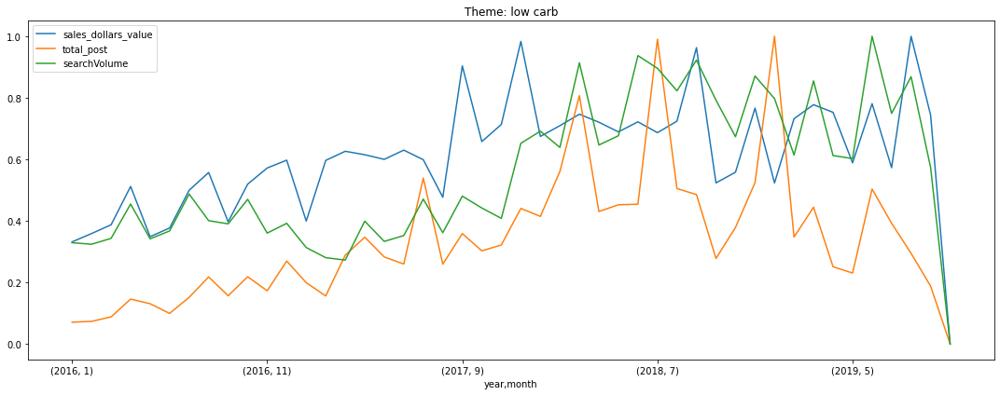

FixedFormatter should only be used together with FixedLocator



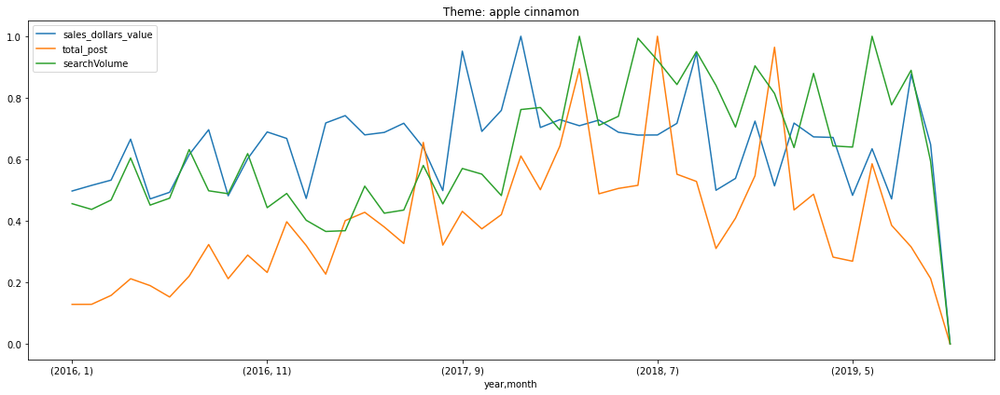

FixedFormatter should only be used together with FixedLocator



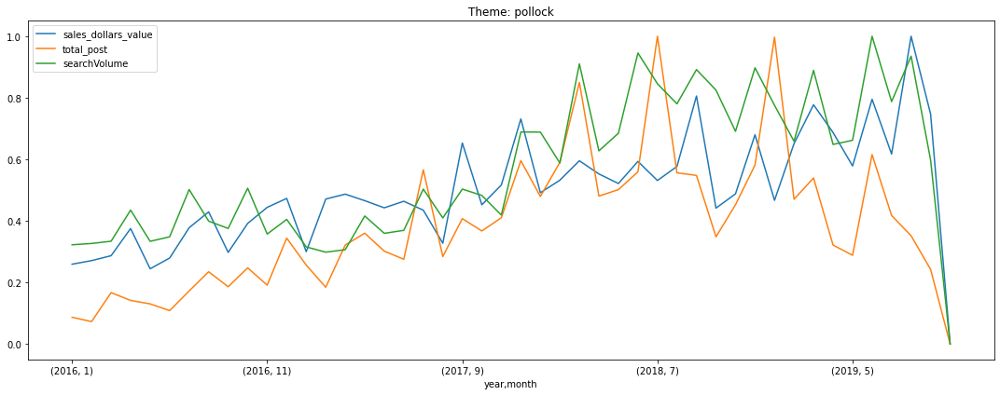

FixedFormatter should only be used together with FixedLocator



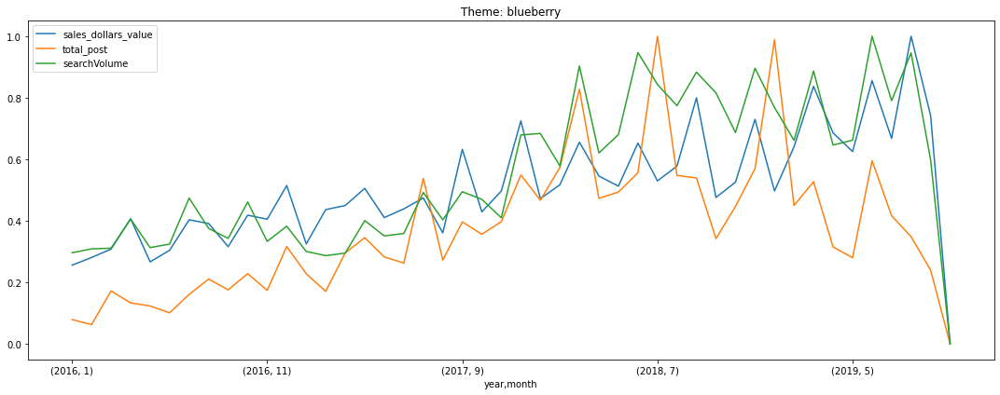

FixedFormatter should only be used together with FixedLocator



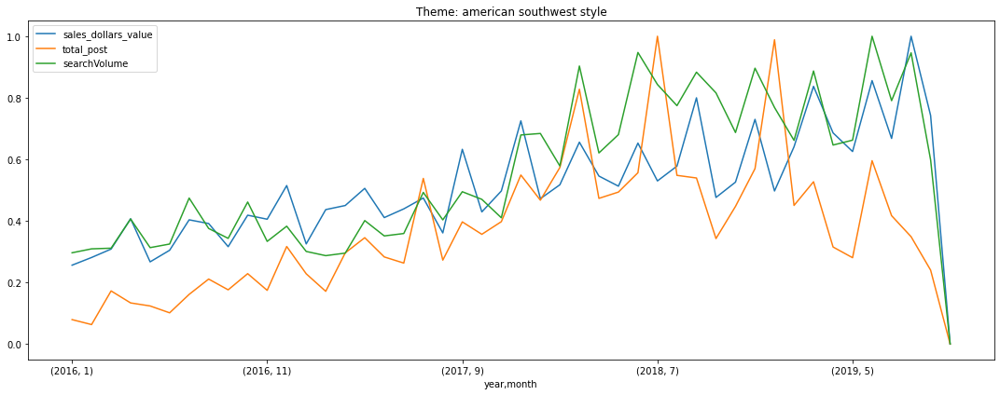

FixedFormatter should only be used together with FixedLocator



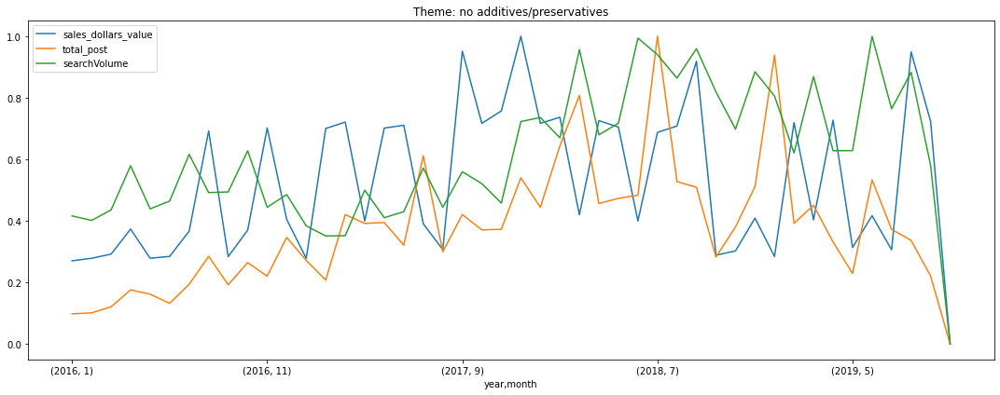

FixedFormatter should only be used together with FixedLocator



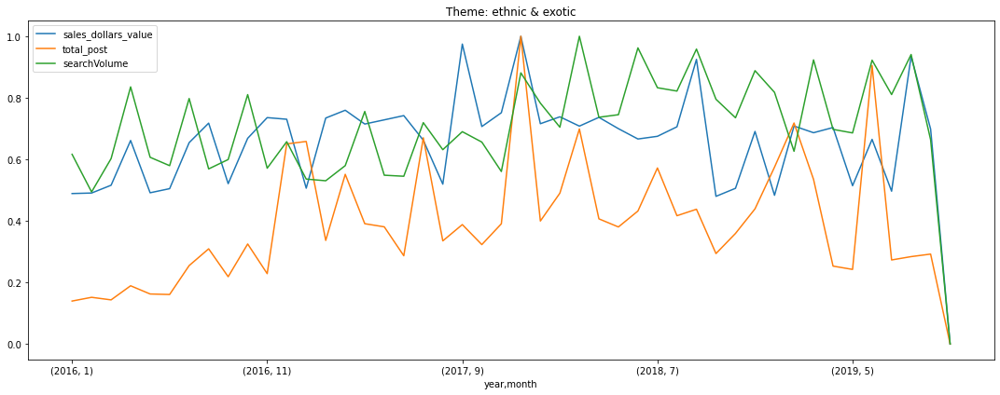

FixedFormatter should only be used together with FixedLocator



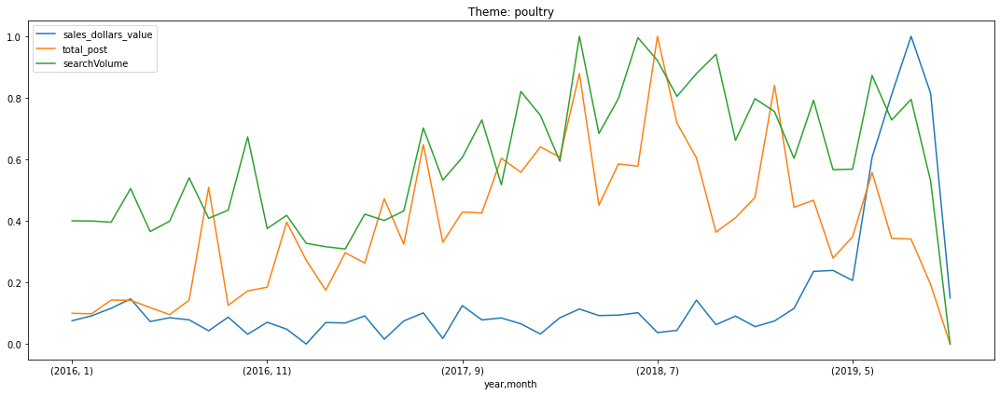

FixedFormatter should only be used together with FixedLocator



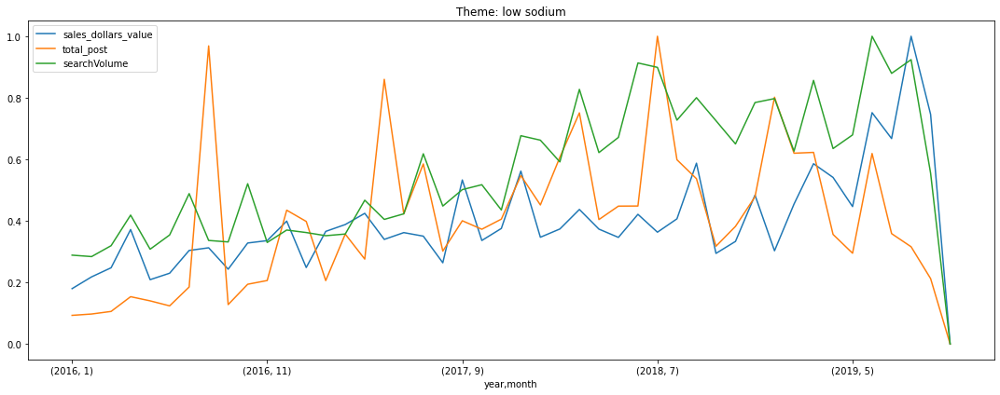

FixedFormatter should only be used together with FixedLocator



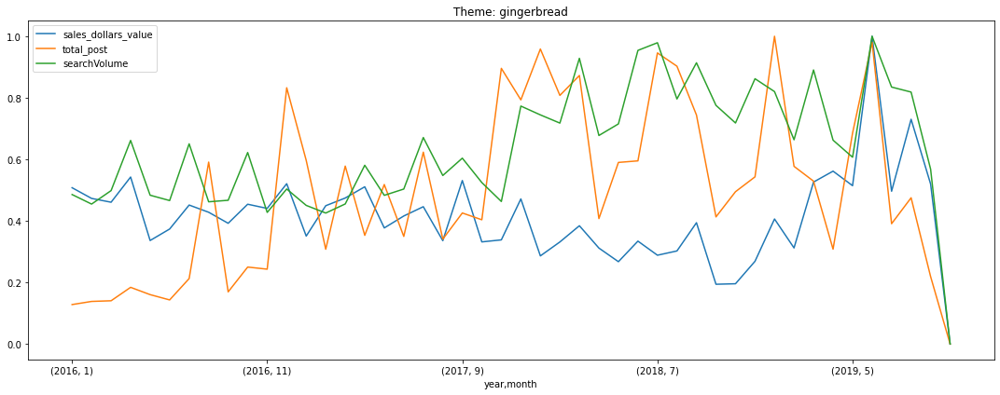

FixedFormatter should only be used together with FixedLocator



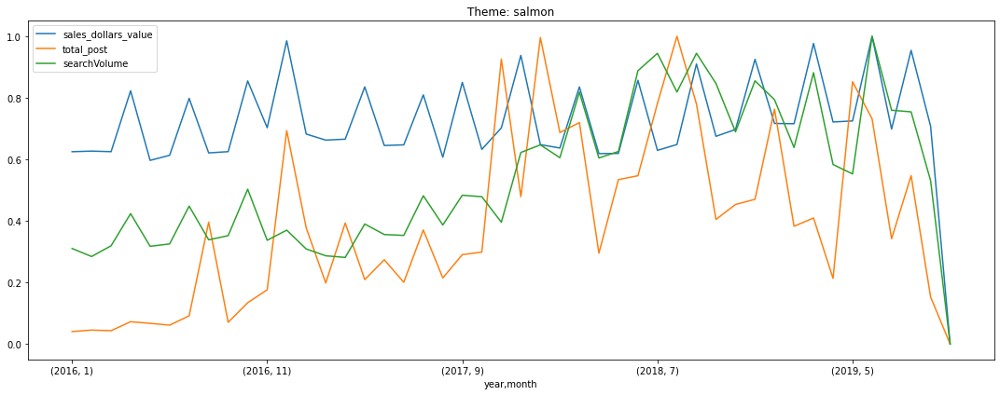

FixedFormatter should only be used together with FixedLocator



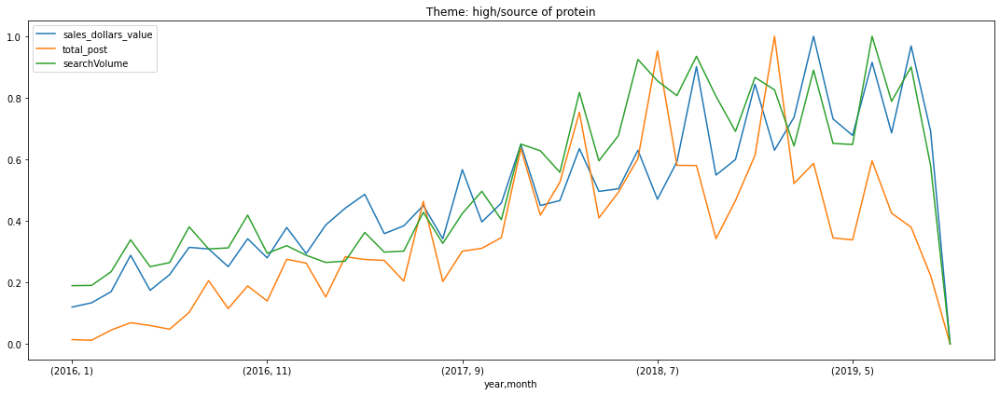

FixedFormatter should only be used together with FixedLocator



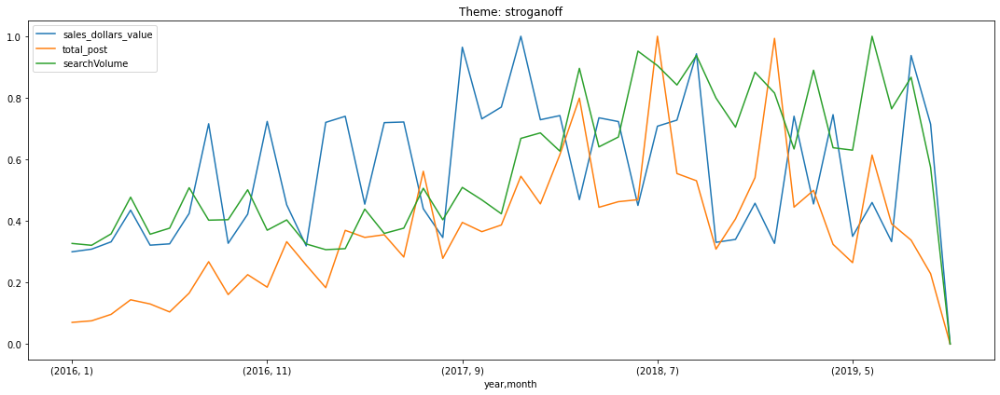

FixedFormatter should only be used together with FixedLocator



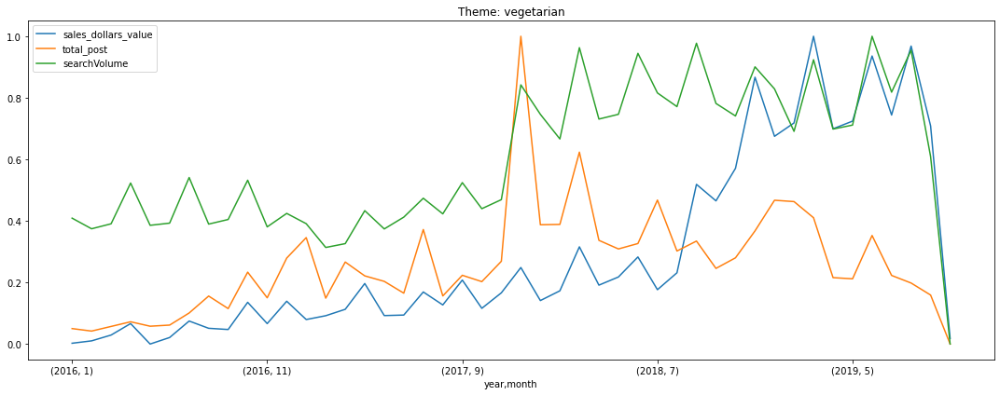

FixedFormatter should only be used together with FixedLocator



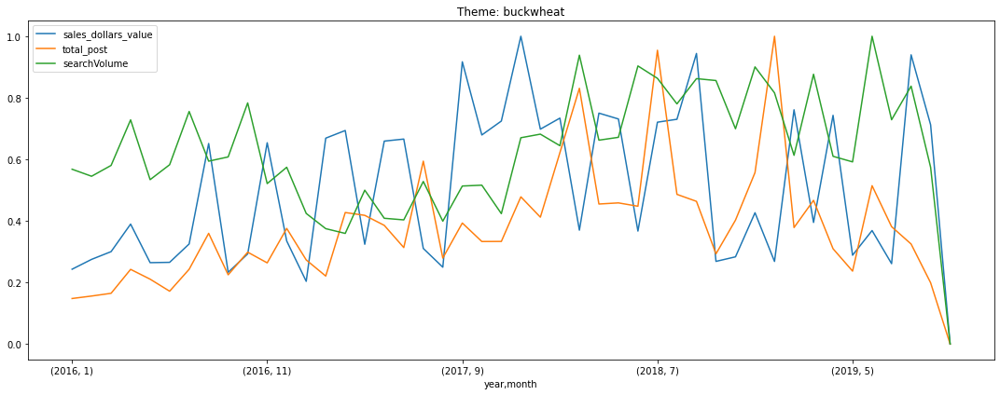

FixedFormatter should only be used together with FixedLocator



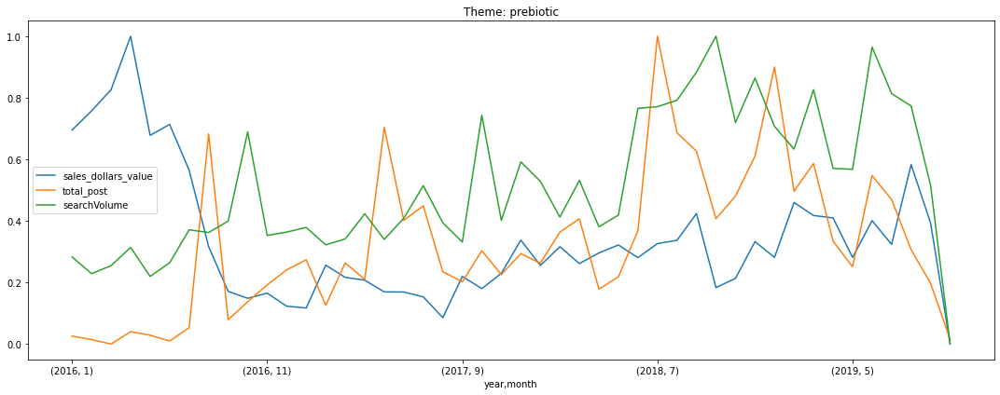

FixedFormatter should only be used together with FixedLocator



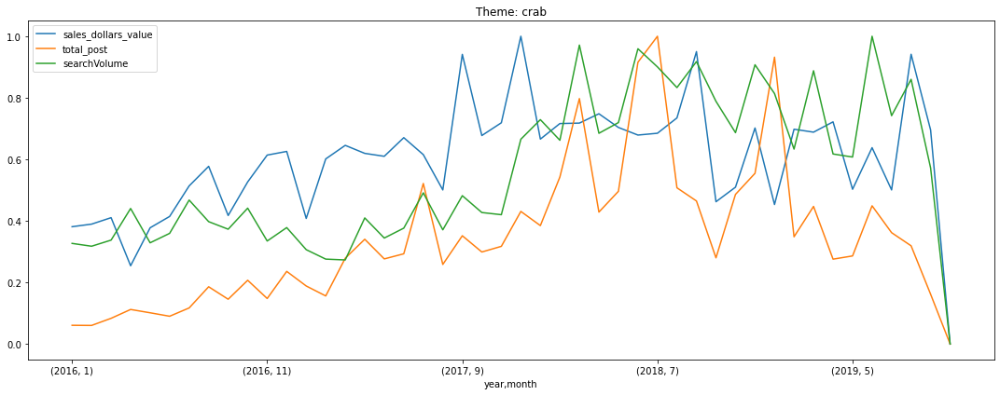

FixedFormatter should only be used together with FixedLocator



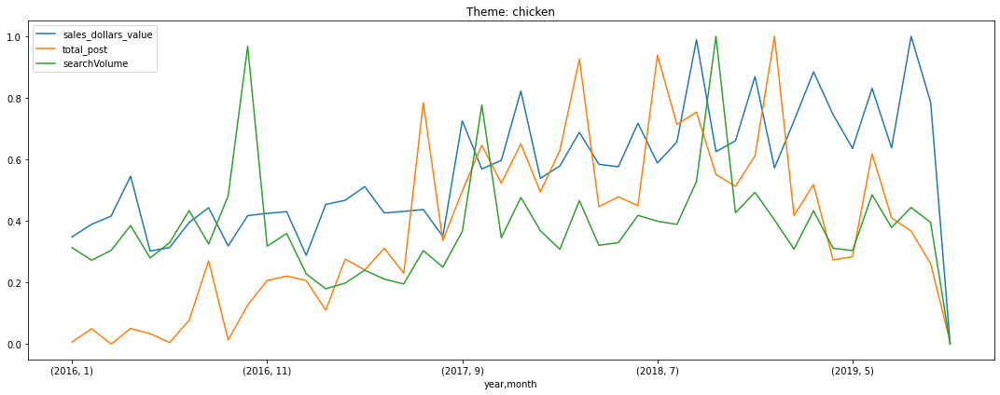

FixedFormatter should only be used together with FixedLocator



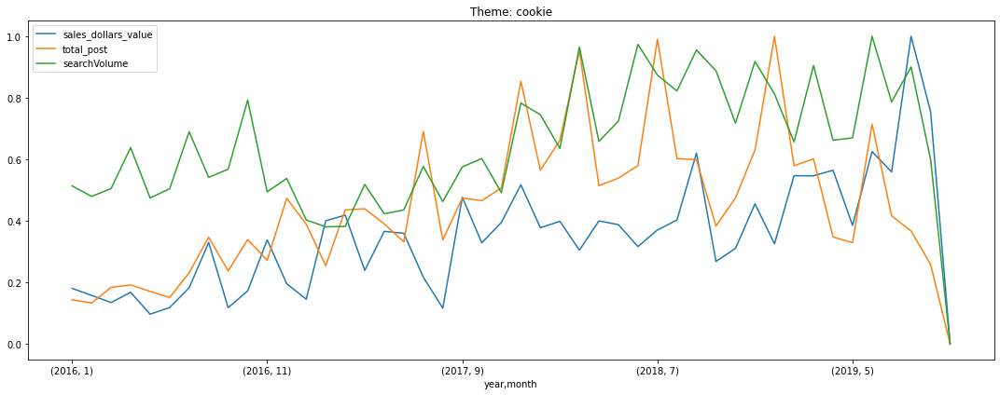

FixedFormatter should only be used together with FixedLocator



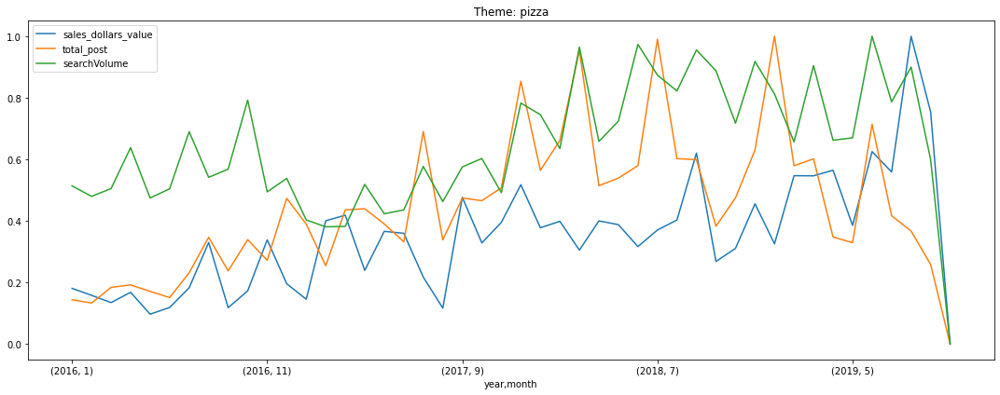

FixedFormatter should only be used together with FixedLocator



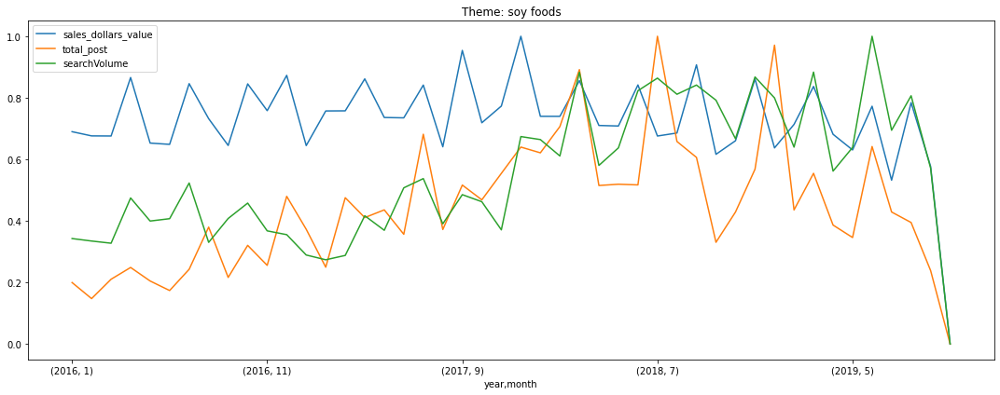

FixedFormatter should only be used together with FixedLocator



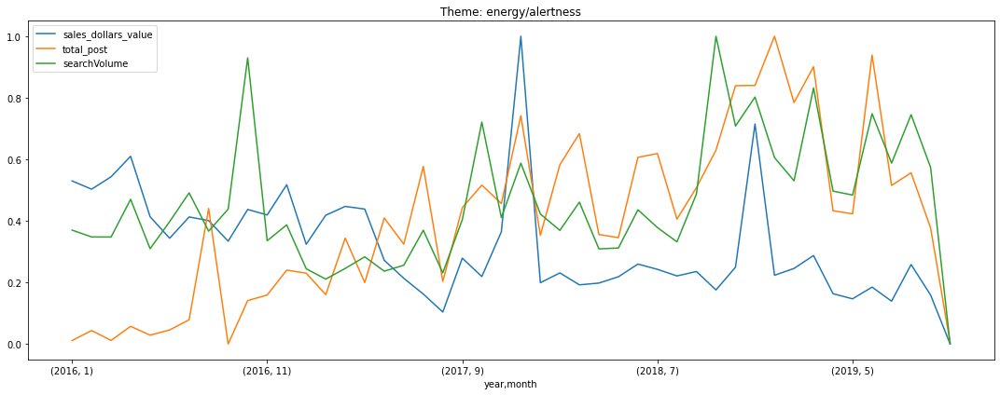

FixedFormatter should only be used together with FixedLocator



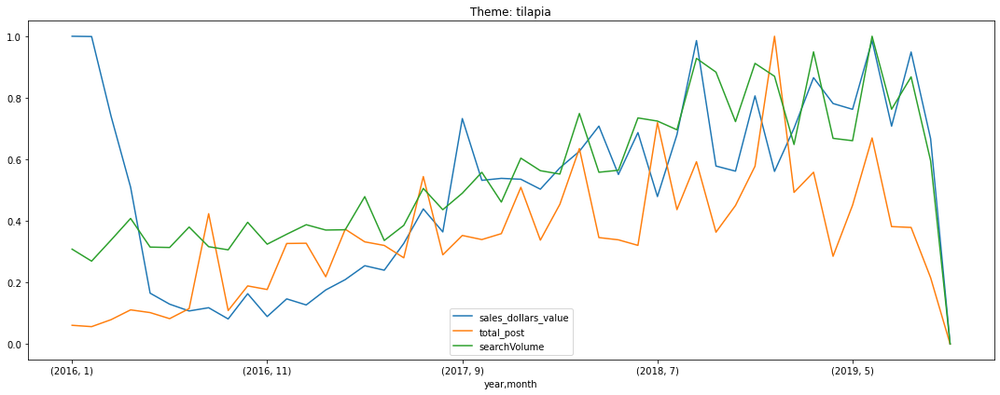

FixedFormatter should only be used together with FixedLocator



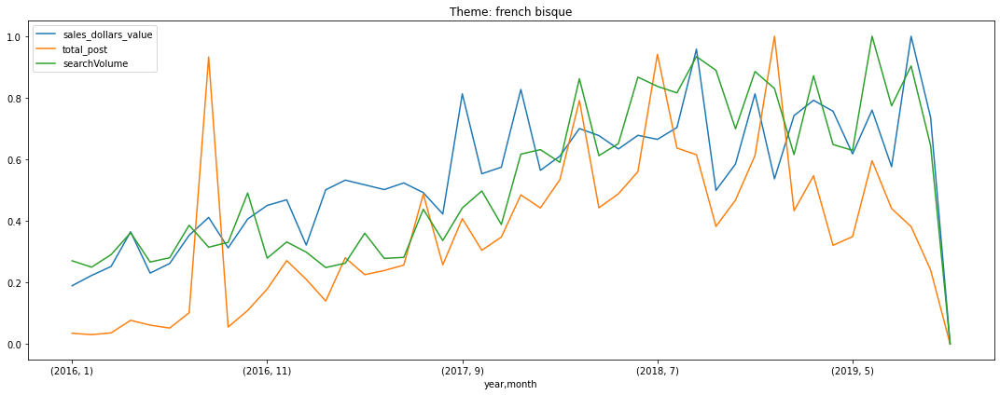

FixedFormatter should only be used together with FixedLocator



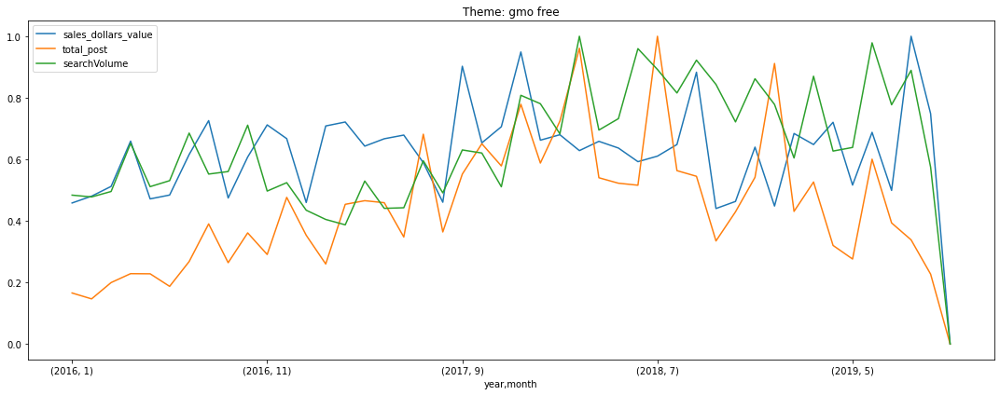

FixedFormatter should only be used together with FixedLocator



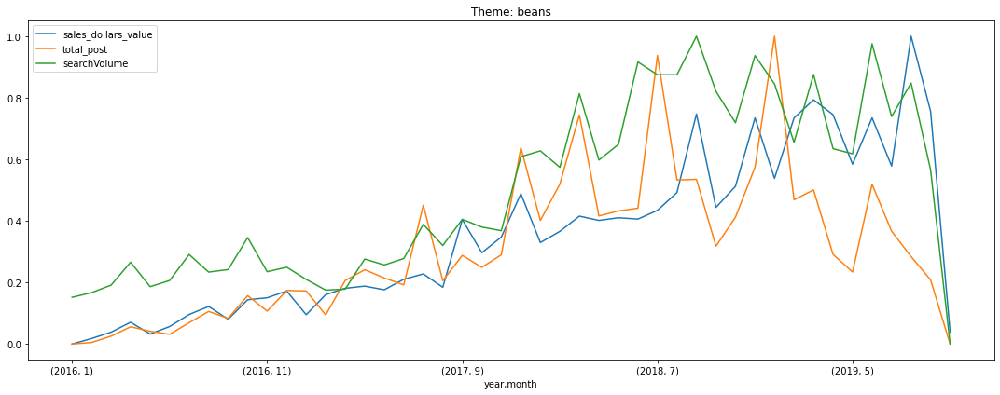

FixedFormatter should only be used together with FixedLocator



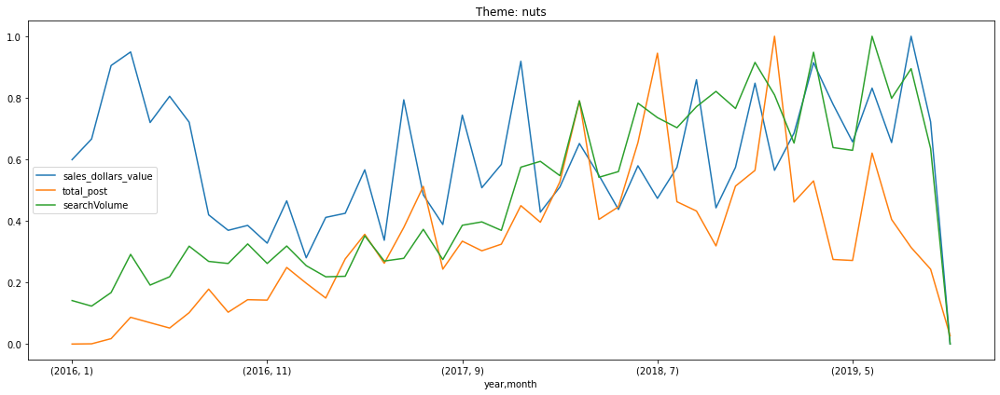

FixedFormatter should only be used together with FixedLocator



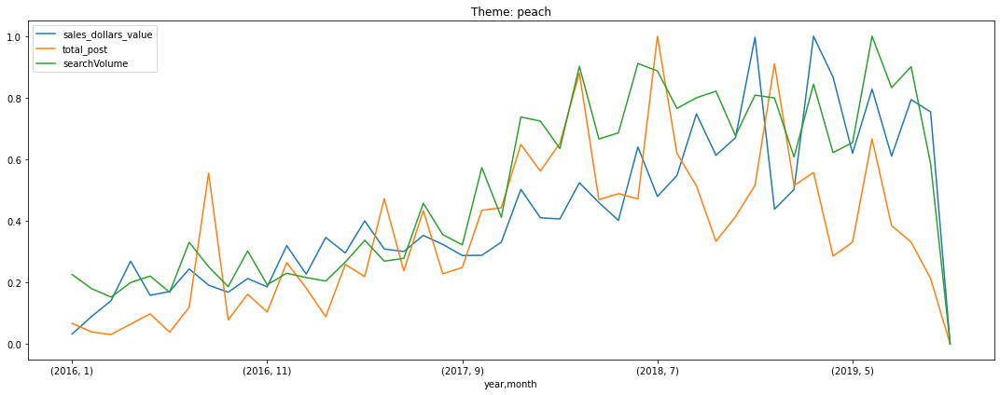

FixedFormatter should only be used together with FixedLocator



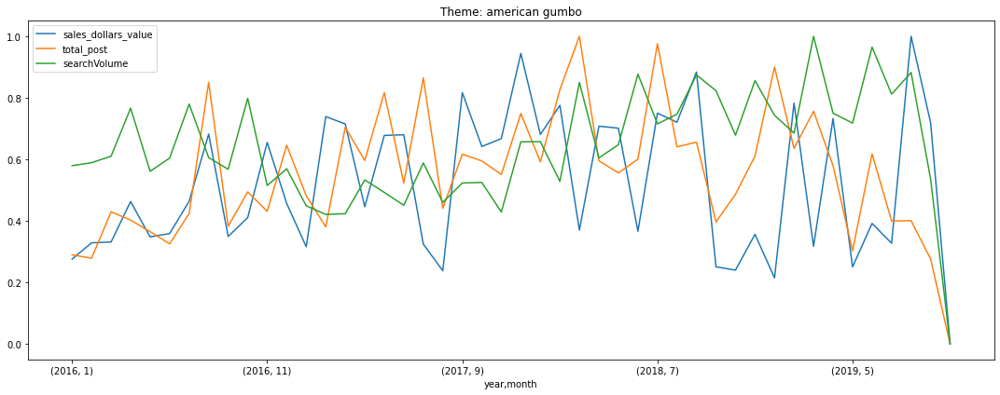

FixedFormatter should only be used together with FixedLocator



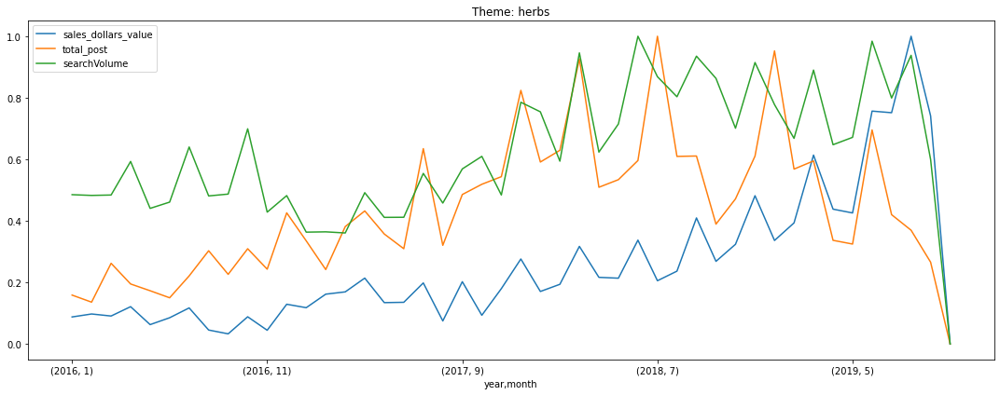

FixedFormatter should only be used together with FixedLocator



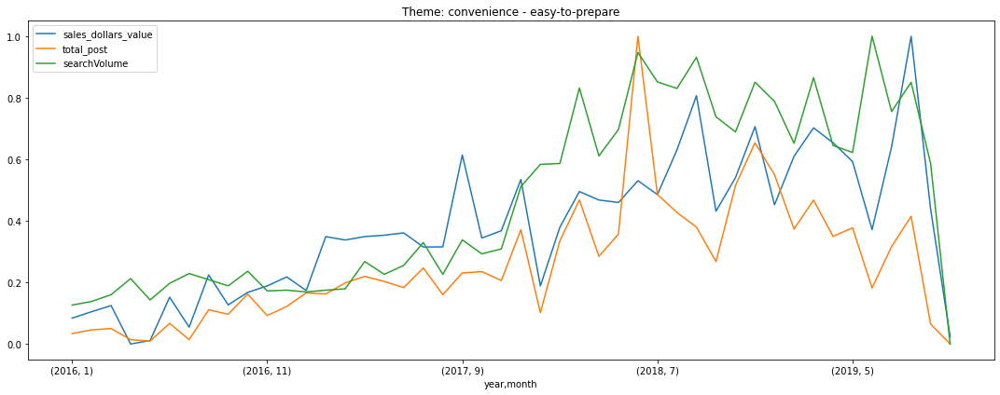

FixedFormatter should only be used together with FixedLocator



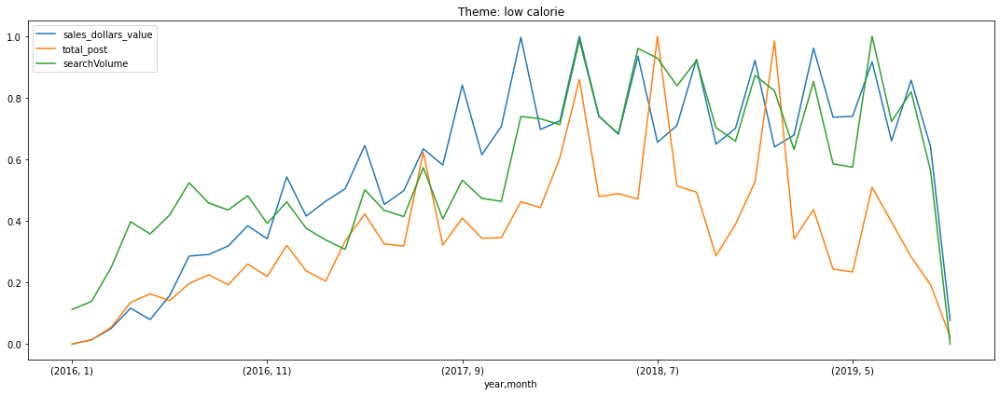

FixedFormatter should only be used together with FixedLocator



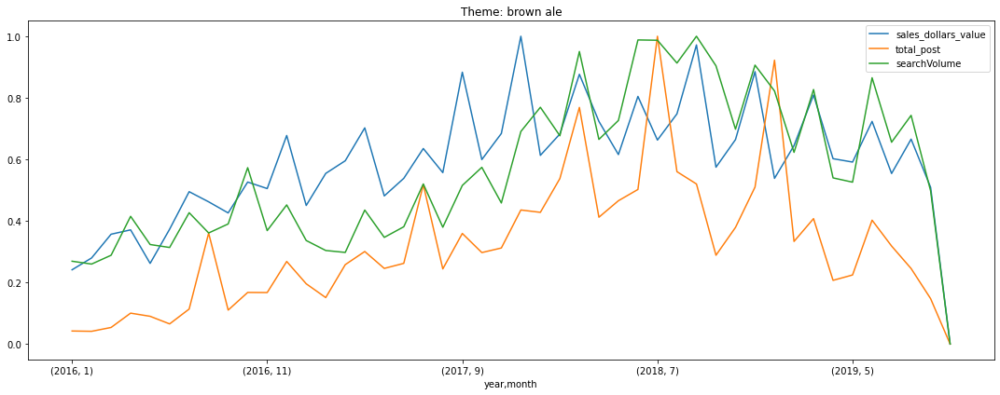

FixedFormatter should only be used together with FixedLocator



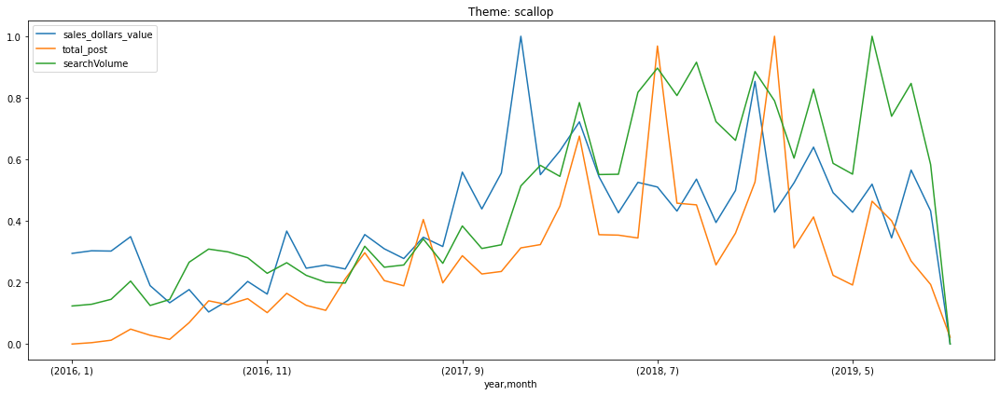

FixedFormatter should only be used together with FixedLocator



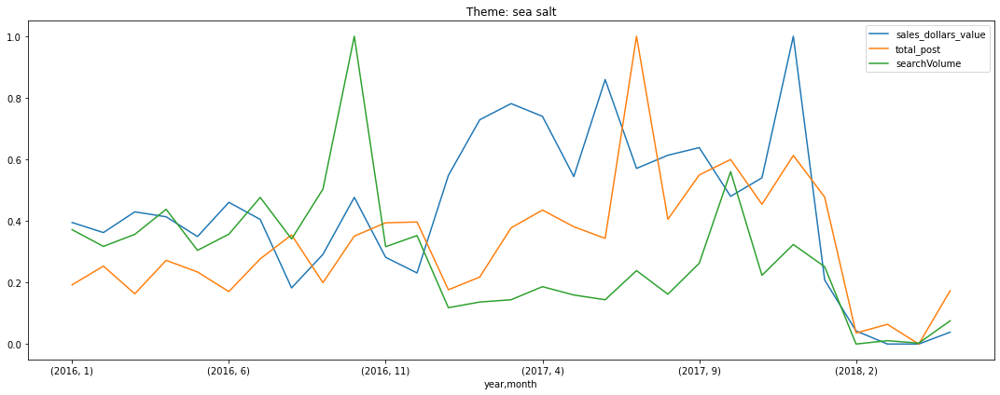

FixedFormatter should only be used together with FixedLocator



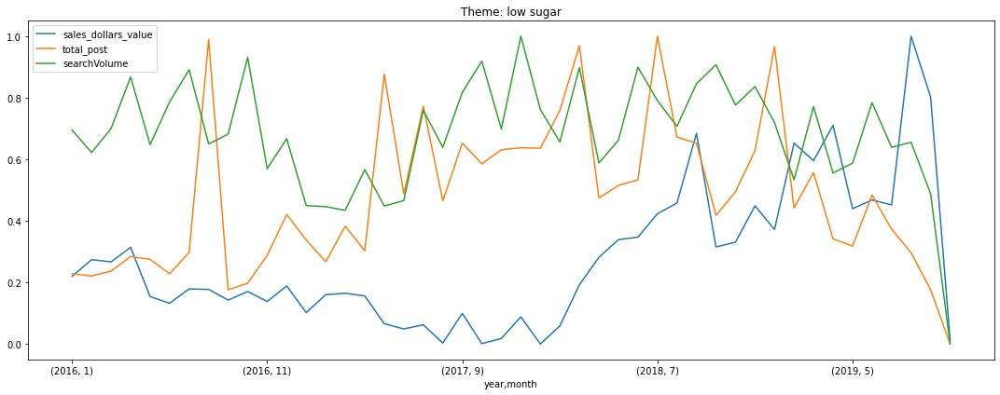

FixedFormatter should only be used together with FixedLocator



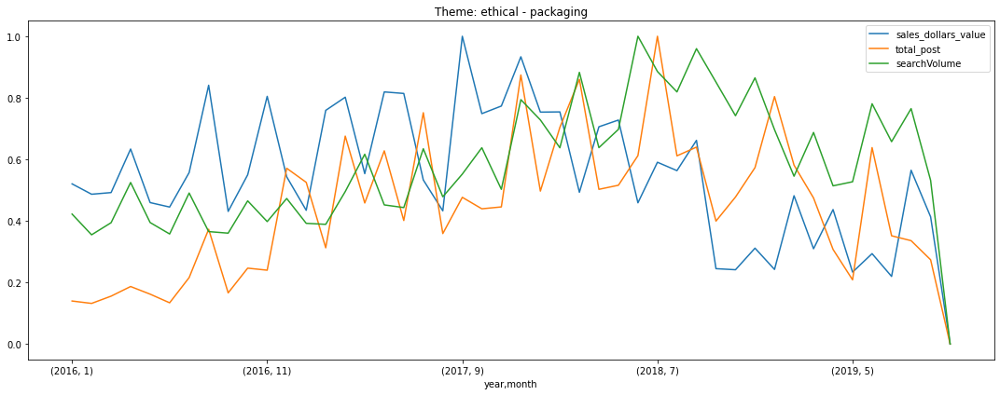

FixedFormatter should only be used together with FixedLocator



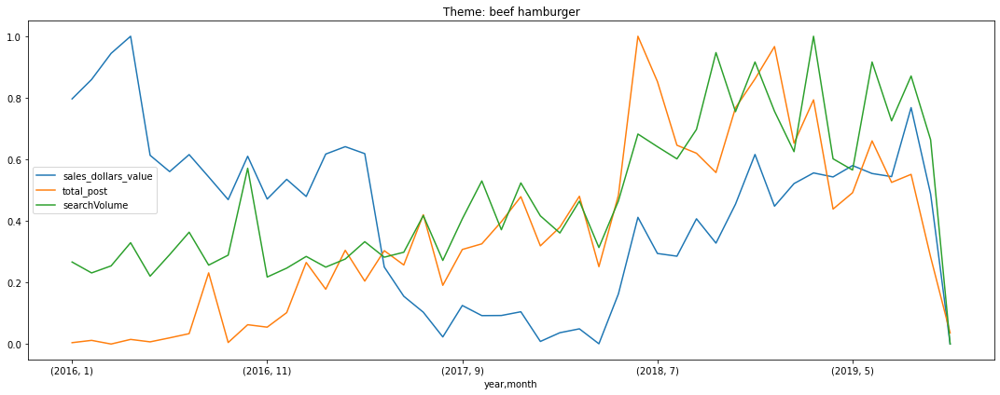

FixedFormatter should only be used together with FixedLocator



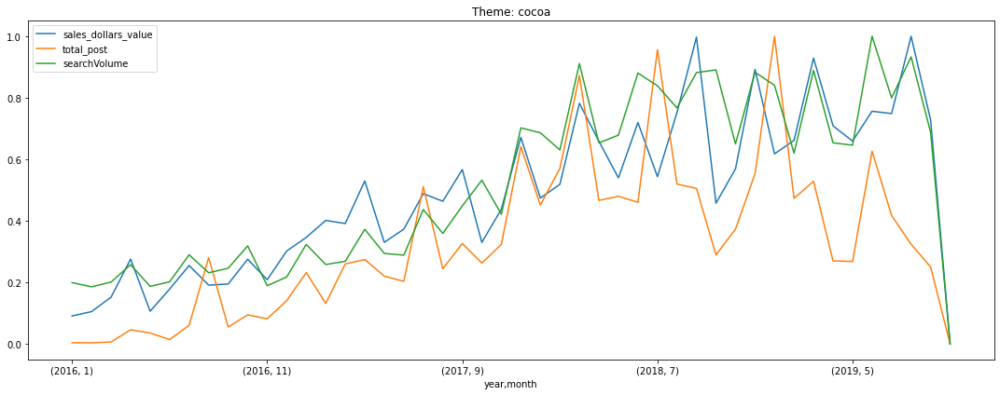

FixedFormatter should only be used together with FixedLocator



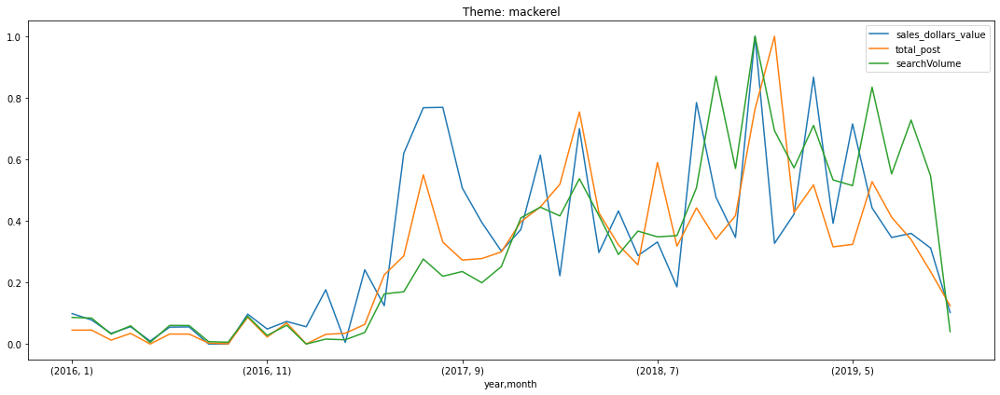

FixedFormatter should only be used together with FixedLocator



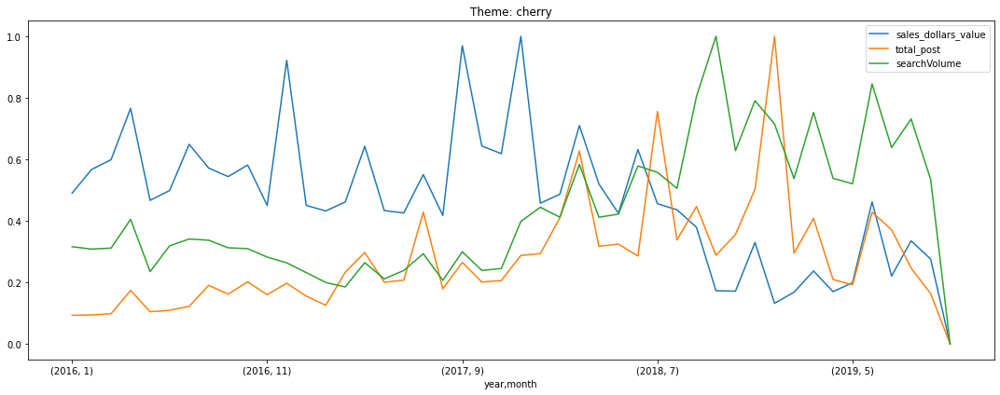

FixedFormatter should only be used together with FixedLocator



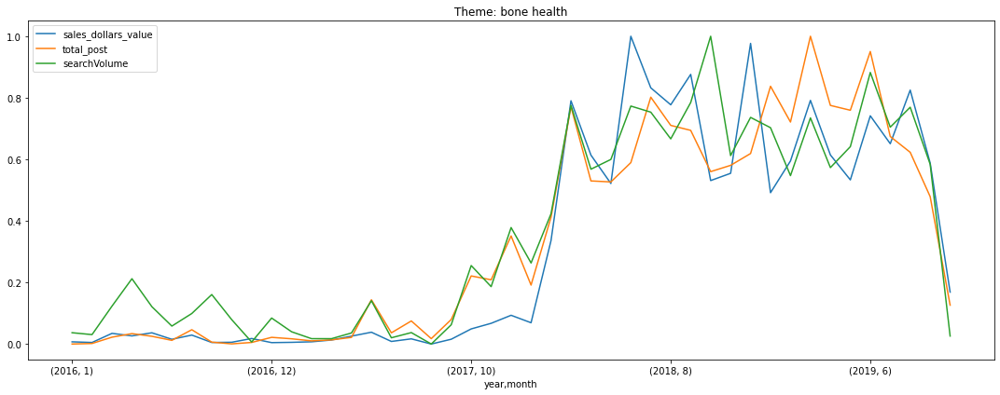

FixedFormatter should only be used together with FixedLocator



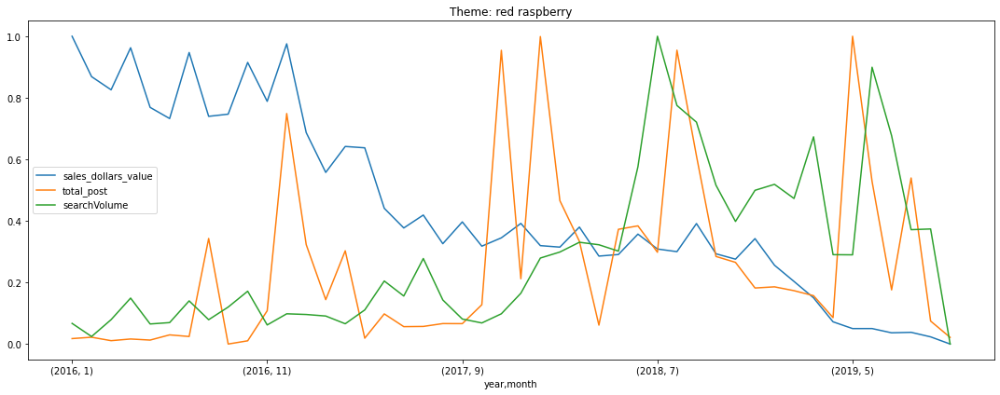

FixedFormatter should only be used together with FixedLocator



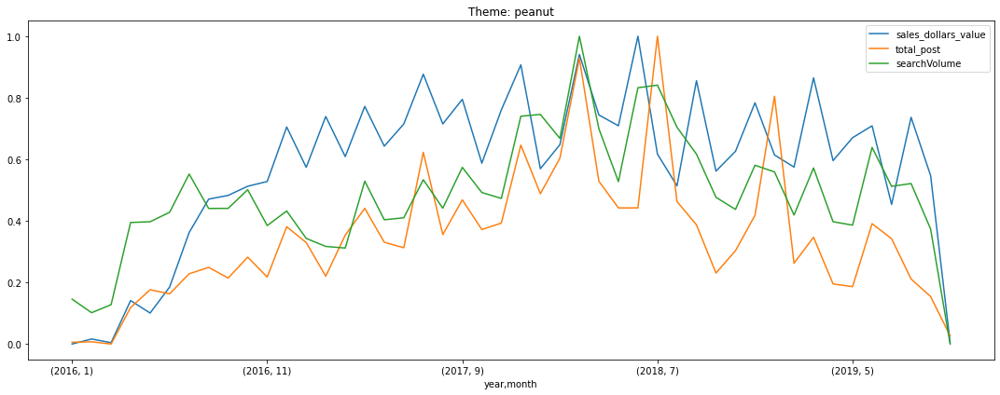

FixedFormatter should only be used together with FixedLocator



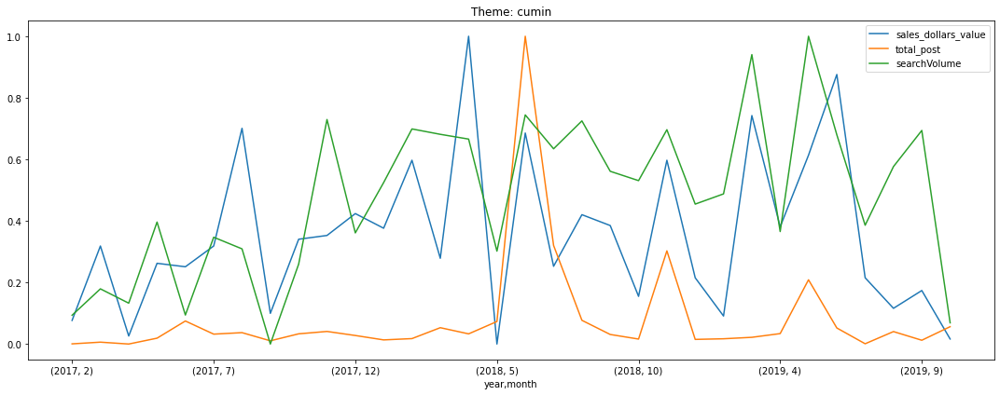

FixedFormatter should only be used together with FixedLocator



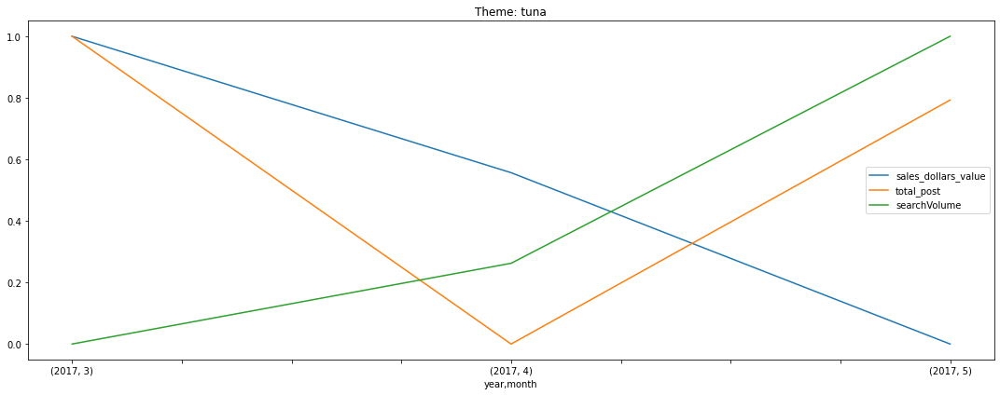

FixedFormatter should only be used together with FixedLocator



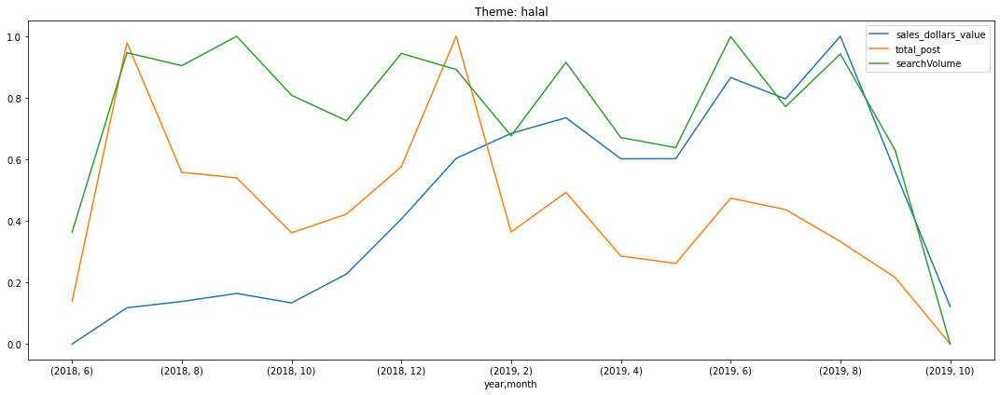

FixedFormatter should only be used together with FixedLocator



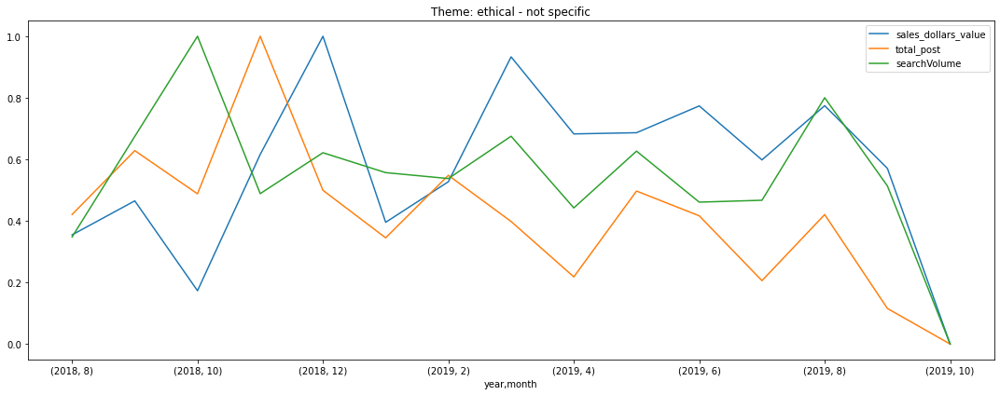

In [185]:
for i in final_df['Claim Name'].unique():
    df = final_df[final_df['Claim Name'] == i]
    latency_theme = df.groupby(['year', 'month'])[["sales_dollars_value", "total_post", "searchVolume"]].sum()
    for j in latency_theme.columns:
        latency_theme[j]=(latency_theme[j]-latency_theme[j].min())/(latency_theme[j].max()-latency_theme[j].min())
    latency_theme.plot(figsize=(15,6))
    plt.title('Theme: {}'.format(i))
    plt.show()

In [186]:
final_data.head()

,sales_dollars_value,sales_units_value,sales_lbs_value,totalposts,searchvolume
0,13927.0,934,18680,180.593046,2656.600568
1,12628.0,878,17564,180.593046,2656.600568
2,11379.0,810,16200,180.593046,2656.600568
3,11568.0,821,16424,180.593046,2656.600568
4,10959.0,784,15682,180.593046,2656.600568


# Build the sales model and identify the driver of sales

In [187]:
final_data

,sales_dollars_value,sales_units_value,sales_lbs_value,totalposts,searchvolume
0,13927.0,934,18680,180.593046,2656.600568
1,12628.0,878,17564,180.593046,2656.600568
2,11379.0,810,16200,180.593046,2656.600568
3,11568.0,821,16424,180.593046,2656.600568
4,10959.0,784,15682,180.593046,2656.600568
...,...,...,...,...,...
7767415,699.0,37,129,180.593046,2656.600568
7767416,486.0,7,158,180.593046,2656.600568
7767417,53.0,3,16,329.786462,3759.708522
7767418,6.0,1,7,180.593046,2656.600568


In [188]:
X = final_data.drop(columns=['sales_dollars_value'])

In [189]:
y = final_data['sales_dollars_value']

In [190]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [207]:
le = LinearRegression()
le.fit(X_train,y_train)

print(le.coef_)
print(le.intercept_)

train_pred = le.predict(X_train)
test_pred = le.predict(X_test)
  
rmse1 = np.sqrt(MSE(y_train, train_pred))
rmse2 = np.sqrt(MSE(y_test, test_pred))
print("train RMSE : % f" %(rmse1))
print("test RMSE : % f" %(rmse2))

r21=r2_score(y_train,train_pred)
r22=r2_score(y_test, test_pred)
print("train R2 score : % f" %(r21))
print("test R2 score : % f" %(r22))

mae1=mean_absolute_error(y_train, train_pred)
mae2=mean_absolute_error(y_test, test_pred)
print("train MAE : % f" %(mae1))
print("test MAE : % f" %(mae2))

le

[ 0.63510614  0.52274213 -6.51356634 -0.34332505]
12472.28651000847
train RMSE :  36757.157879
test RMSE :  36708.015254
train R2 score :  0.703738
test R2 score :  0.707131
train MAE :  14929.445565
test MAE :  14933.452508


LinearRegression()

In [208]:
np.mean(np.abs((y_test - test_pred)/y_test)*100)

13184.043392461423

In [209]:
y_test - test_pred

411072     10325.877554
582264     -8779.608265
3742226   -10789.105023
1913886    -5007.175922
4076038   -10405.422495
               ...     
6245152   -10383.401832
5365005    -9640.261327
7765218   -10661.005990
1654736    -3117.240700
4108597     2412.515356
Name: sales_dollars_value, Length: 2330226, dtype: float64

In [192]:
reg.fit(X_train, y_train)

LinearRegression()

In [193]:
reg.coef_

array([ 0.63510614,  0.52274213, -6.51356634, -0.34332505])

In [194]:
reg.score(X_test, y_test)

0.7071311401259516

In [195]:
X_ = sm.add_constant(X_train)

# Fit and summarize OLS model
mod = sm.OLS(y_train, X_)
res = mod.fit()

print(res.summary())

                             OLS Regression Results                            
Dep. Variable:     sales_dollars_value   R-squared:                       0.704
Model:                             OLS   Adj. R-squared:                  0.704
Method:                  Least Squares   F-statistic:                 3.229e+06
Date:                 Mon, 30 May 2022   Prob (F-statistic):               0.00
Time:                         09:39:43   Log-Likelihood:            -6.4871e+07
No. Observations:              5437194   AIC:                         1.297e+08
Df Residuals:                  5437189   BIC:                         1.297e+08
Df Model:                            4                                         
Covariance Type:             nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              1.247e+04

In [196]:
rfe = RFE(LinearRegression(), 4)
rfe.fit(X_train,y_train)

Pass n_features_to_select=4 as keyword args. From version 0.25 passing these as positional arguments will result in an error



RFE(estimator=LinearRegression(), n_features_to_select=4)

In [197]:
rfe.score(X_test, y_test)

0.7071311401259516

In [206]:
from sklearn.metrics import mean_squared_error as MSE,r2_score,mean_absolute_error
from xgboost import XGBRegressor

model= XGBRegressor(booster='gblinear',n_estimators = 100,learning_rate=0.1,n_jobs=4)
model.fit(X_train, y_train)

print(model.coef_)
print(model.intercept_)

train_pred = model.predict(X_train)
test_pred = model.predict(X_test)
  
rmse1 = np.sqrt(MSE(y_train, train_pred))
rmse2 = np.sqrt(MSE(y_test, test_pred))
print("train RMSE : % f" %(rmse1))
print("test RMSE : % f" %(rmse2))

r21=r2_score(y_train,train_pred)
r22=r2_score(y_test, test_pred)
print("train R2 score : % f" %(r21))
print("test R2 score : % f" %(r22))

mae1=mean_absolute_error(y_train, train_pred)
mae2=mean_absolute_error(y_test, test_pred)
print("train MAE : % f" %(mae1))
print("test MAE : % f" %(mae2))

model

[ 0.637538  0.522982 -1.49666  -0.173148]
[10845.9]
train RMSE :  36765.085757
test RMSE :  36716.138021
train R2 score :  0.703610
test R2 score :  0.707002
train MAE :  14789.615793
test MAE :  14793.445201


XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.1, max_delta_step=None, max_depth=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=4, num_parallel_tree=None, random_state=0,
             reg_alpha=0, reg_lambda=0, scale_pos_weight=1, subsample=None,
             tree_method=None, validate_parameters=1, verbosity=None)

In [240]:
X_train.shape

(5437194, 4)